# Magnification factor of $\beta$-VAE toy example
[Yusuke Hayashi](https://github.com/hayashiyus)<br/>
January 1, 2025 <br/>

## Variational inference
Given samples $x$ from an unobserved data density $q(x)$, we are interested in building a latent-variable generative model $p_{\varphi}(x, z)$ such that $p(x)$ is close to $q(x)$. This is a difficult problem as evaluating the density under the model, $p(x)$ requires evaluating an intractable integral over the unobserved latent variable $z$: $p_{\varphi}(x)=\int \mathrm{d}z \;p_{\varphi}(x, z)$.
$$
\begin{gathered}
q_\phi(x, z) = q(x) q_\phi(z \mid x) \\
p_{\varphi}(x, z) = p(z) p_{\varphi}(x \mid z)
\end{gathered}
$$
The variational principle bypasses this problem by optimizing a lower bound on the log-likelihood of the data. In this case, the objective $\mathcal{L}_{\mathrm{VAE-ELBO}}$:
$$
\begin{aligned}
\mathbb{E}_{q(x)}\left[\log p_{\varphi}(x)\right] & =\mathbb{E}_{q(x)}\left[\log \int p_{\varphi}(x, \psi) d \psi\right] \\
& =\mathbb{E}_{q(x)}\left[\log \int q_\phi(\psi \mid x) \frac{p_{\varphi}(x, \psi)}{q_\phi(\psi \mid x)} d \psi\right] \\
& \geq \mathbb{E}_{q(x)}\left[\int q_\phi(\psi \mid x) \log \frac{p_{\varphi}(x, \psi)}{q_\phi(\psi \mid x)} d \psi\right] \\
& =\mathbb{E}_{q_\phi(x, \psi)}\left[\log p_{\varphi}(x \mid \psi)\right]-\mathbb{E}_{q(x)}\left[D_{\mathrm{KL}}\left(q_\phi(\psi \mid x) \| p(\psi)\right)\right] := \mathcal{L}_{\mathrm{VAE-ELBO}}
\end{aligned}
$$
The objective of $\beta$-VAE $\mathcal{L}_{\beta-\mathrm{VAE}}$ is given as a slight modification of the ELBO of VAE:
$$
\mathcal{L}_{\beta-\mathrm{VAE}} := \mathbb{E}_{q_\phi(x, z)}\left[\log p_{\varphi}(x \mid z)\right]-\frac{1}{\beta} \mathbb{E}_{q(x)}\left[D_{\mathrm{KL}}\left(q_\phi(z \mid x) \| p(z)\right)\right]
$$
The objective of $\beta$-VAE $\mathcal{L}_{\beta-\mathrm{VAE}}$ can be derived according to the variational principle by modifying the respective encoder and decoder models as follows:
$$
\begin{aligned}
& q_{\beta, \phi}(x, z)=\frac{q^\beta(x) q_\phi(z \mid x)}{Z_q(\beta)} . \\
& p_{\beta, \varphi}(x, z)=\frac{p(z) p_{\varphi}^\beta(x \mid z)}{Z_p(\beta)} .
\end{aligned}
$$
$$
\begin{aligned}
\mathcal{L}_{\mathrm{Neq-VAE}} &:= \mathbb{E}_{q_{\beta, \phi}(x, z)}\left[\log p_{\varphi}(x \mid z)\right]-\frac{1}{\beta} \mathbb{E}_{q^\beta(x)}\left[D_{\mathrm{KL}}\left(q_\phi(z \mid x) \| p(z)\right)\right]
\end{aligned}
$$
$$
\begin{aligned}
-\frac{1}{\beta} D_{\mathrm{KL}}\left(q_{\beta, \phi}(x, z) \| p_{\beta, \varphi}(x, z)\right) & =-\frac{1}{\beta} \mathbb{E}_{q_{\beta, \phi}(x, z)}\left[\log \frac{q_{\beta, \phi}(x, z)}{p_{\beta, \varphi}(x, z)}\right] \\
& =-\frac{1}{\beta} \mathbb{E}_{q_{\beta, \phi}(x, z)}\left[\log \frac{Z_p(\beta) q^\beta(x) q_\phi(z \mid x)}{Z_q(\beta) p(z) p_{\varphi}^\beta(x \mid z)}\right] \\
& =\frac{1}{\beta}\left(-\log \frac{Z_p(\beta)}{Z_q(\beta)}+H_{q_\phi^\beta}(x)\right)+\mathcal{L}_{\text{Neq-VAE}} \\
& \geq \frac{1}{\beta}\left(-\log \frac{Z_p(\beta)}{Z_q(\beta)}+H_{q_\phi^\beta}(x)\right)+\mathcal{L}_{\beta-\mathrm{VAE}} .
\end{aligned}
$$

This lower bound depends on an additional distribution, $q(z|x)$ which is known as the _variational distribution_ and acts as an approximation to the true posterior $p(z|x)$.
To evaluate and learn using the variational lower bound, we need to be able to draw samples from the _variational distribution_ and to evaluate the density of a sample from the _variational distribution_. This typically restricts the family of variational distributions to those with known or tractable densities (e.g. factorial Gaussian, normalizing flows).

Send questions/comments/bugs to [@hayashiyus](https://twitter.com/hayashiyus).

## Create dataset of one-hot vectors

In [ ]:
!pip install mplcyberpunk

In [ ]:
import torch
import numpy as np
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Normal, Bernoulli
from torch.utils.data import DataLoader, TensorDataset
from sklearn import datasets
import sklearn.preprocessing as sp
import sklearn.model_selection as sm
import matplotlib
import mplcyberpunk
import matplotlib.cm as cm
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams

plt.style.use("cyberpunk")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load training datasets
MNIST = datasets.load_digits()
X = MNIST.data  # X: images
X = X / 16  # Normalize pixel values
yl = MNIST.target  # yl: labels
D, n = X.shape

n_im_row, n_im_col = 5, 15
n_im = n_im_row * n_im_col
d = np.arange(D)
d_choice = np.random.choice(np.arange(D), n_im, replace=False)

n_px_row = np.floor(np.sqrt(n)).astype('int')
n_px_col = (n / n_px_row).astype('int')

# Split the dataset into train and test datasets
X_train, X_test, yl_train, yl_test = sm.train_test_split(X, yl, train_size=1/2, test_size=1/2)

X_test = X_test[:-1]
yl_test = yl_test[:-1]

# create dataset of one-hot vectors
# class size
C = 10
# .A means 'change the data type from a matrix to an array'
enc = sp.OneHotEncoder()
Y_train = enc.fit_transform(yl_train.reshape(-1, 1)).A
Y_test = enc.fit_transform(yl_test.reshape(-1, 1)).A

print('訓練データ数：D_train =', len(Y_train))
print('テストデータ数：D_test =', len(Y_test))

# Convert numpy arrays to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32).to(device)
X_test = torch.tensor(X_test, dtype=torch.float32).to(device)
Y_train = torch.tensor(Y_train, dtype=torch.long).to(device)
Y_test = torch.tensor(Y_test, dtype=torch.long).to(device)

訓練データ数：D_train = 898
テストデータ数：D_test = 898


## Setup

In [ ]:
# Constants
n_epoch = 200000 + 1
batch_size = X_train.shape[0]
latent_dim = 2  # Assuming latent_dim is 2 for this example
n_layer = 8  # Assuming n_layer is 4 for this example
n_unit = 256  # Assuming n_unit is 256 for this example
n_head = 4
output_dim = Y_train.shape[1]  # Assuming output_dim is the number of classes

# Data
x = torch.tensor(X_train, dtype=torch.float32).to(device)
y = torch.tensor(Y_train, dtype=torch.float32).to(device)

# データセットの準備
train_dataset = TensorDataset(torch.tensor(X_train), torch.tensor(Y_train))
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Encoder network
class Encoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim):
        super(Encoder, self).__init__()
        self.fc_layers = nn.Sequential(*[nn.Linear(hidden_dim if i > 0 else input_dim, hidden_dim) for i in range(n_layer)])
        self.loc = nn.Linear(hidden_dim, latent_dim)
        self.scale = nn.Linear(hidden_dim, latent_dim)
        self.softplus = nn.Softplus()

    def forward(self, x):
        enc = self.fc_layers(x)
        loc = self.loc(enc)
        scale = 1e-6 + (1 - 2e-6) * self.softplus(self.scale(enc))
        return loc, scale

# Decoder network
class Decoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, output_dim):
        super(Decoder, self).__init__()
        self.fc_layers = nn.Sequential(*[nn.Linear(hidden_dim if i > 0 else latent_dim, hidden_dim) for i in range(n_layer)])
        self.dec = nn.Linear(hidden_dim, output_dim)
        self.sigmoid = nn.Sigmoid()

    def forward(self, z):
        dec = self.fc_layers(z)
        dec = 1e-6 + (1 - 2e-6) * self.sigmoid(self.dec(dec))
        return dec

class LearnablePositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=512):
        super().__init__()
        # (max_len, d_model) のパラメータを学習させる
        self.pos_embed = nn.Parameter(torch.zeros(1, max_len, d_model))

    def forward(self, x):
        """
        x: (batch_size, seq_len, d_model)
        """
        seq_len = x.size(1)
        # pos_embed は (1, max_len, d_model) なので先頭 seq_len 分だけ取り出す
        return x + self.pos_embed[:, :seq_len, :]

# Encoder network
class TransformerEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim, n_layer=4, n_head=4):
        super().__init__()
        # 1. 入力次元 -> d_model への写像
        self.linear_in = nn.Linear(1, hidden_dim)

        # 2. 学習可能な位置埋め込み (必要に応じて)
        self.pos_encoder = LearnablePositionalEncoding(hidden_dim, max_len=input_dim)

        # 3. TransformerEncoder の定義
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=hidden_dim,
            nhead=n_head,
            dim_feedforward=hidden_dim * 4,  # 内部 MLP の次元
            dropout=0.1,
            batch_first=False   # 後で (seq_len, batch, d_model) で処理するため
        )
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=n_layer)

        # 4. 出力（平均プーリング or CLSトークンの代わりに先頭を取るなど）
        self.loc = nn.Linear(hidden_dim, latent_dim)
        self.scale = nn.Linear(hidden_dim, latent_dim)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        """
        x: (batch_size, input_dim)
        """
        batch_size, seq_len = x.shape

        # (batch_size, seq_len) -> (batch_size, seq_len, 1)
        x = x.unsqueeze(-1)

        # (batch_size, seq_len, 1) -> (batch_size, seq_len, hidden_dim)
        x = self.linear_in(x)

        # 学習可能な位置埋め込みを加算 -> (batch_size, seq_len, hidden_dim)
        x = self.pos_encoder(x)

        # TransformerEncoder は (seq_len, batch_size, hidden_dim) を想定
        x = x.transpose(0, 1)  # -> (seq_len, batch_size, hidden_dim)

        # Transformer Encoder を通過
        x = self.transformer_encoder(x)  # -> (seq_len, batch_size, hidden_dim)

        # 軸を戻す -> (batch_size, seq_len, hidden_dim)
        x = x.transpose(0, 1)

        # ここでは seq_len 次元を平均プーリング
        # (batch_size, seq_len, hidden_dim) -> (batch_size, hidden_dim)
        x = x.mean(dim=1)

        # loc, scale を計算
        loc = self.loc(x)  # (batch_size, latent_dim)
        scale = 1e-6 + (1 - 2e-6) * self.sigmoid(self.scale(x))  # 例のように softplus

        return loc, scale

# Decoder network
class TransformerDecoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, output_dim, n_layer=4, n_head=4):
        super().__init__()
        # 1. (1 -> hidden_dim)
        self.linear_in = nn.Linear(1, hidden_dim)

        # 2. 学習可能な位置埋め込み (必要に応じて)
        self.pos_encoder = LearnablePositionalEncoding(hidden_dim, max_len=latent_dim)

        # 3. TransformerEncoderLayer を使って簡易的に“デコーダ”を作成
        decoder_layer = nn.TransformerEncoderLayer(
            d_model=hidden_dim,
            nhead=n_head,
            dim_feedforward=hidden_dim * 4,
            dropout=0.1,
            batch_first=False
        )
        self.transformer_decoder = nn.TransformerEncoder(decoder_layer, num_layers=n_layer)

        # 4. 出力層
        self.dec = nn.Linear(hidden_dim, output_dim)
        self.sigmoid = nn.Sigmoid()

    def forward(self, z):
        """
        z: (batch_size, latent_dim)
        """
        batch_size, seq_len = z.shape

        # (batch_size, seq_len) -> (batch_size, seq_len, 1)
        z = z.unsqueeze(-1)

        # (batch_size, seq_len, 1) -> (batch_size, seq_len, hidden_dim)
        z = self.linear_in(z)

        # 学習可能な位置埋め込みを加算 -> (batch_size, seq_len, hidden_dim)
        z = self.pos_encoder(z)

        # (batch_size, seq_len, hidden_dim) -> (seq_len, batch_size, hidden_dim)
        z = z.transpose(0, 1)

        # Transformer “decoder” を通過
        z = self.transformer_decoder(z)  # -> (seq_len, batch_size, hidden_dim)

        # 軸を戻す
        z = z.transpose(0, 1)  # (batch_size, seq_len, hidden_dim)

        # seq_len 次元を平均プーリング
        z = z.mean(dim=1)  # (batch_size, hidden_dim)

        # 最終出力
        dec = self.dec(z)
        # Sigmoid の前後で 1e-6 + ... のようなスケーリングをするなら元コードのように下記でも可
        dec = 1e-6 + (1 - 2e-6) * self.sigmoid(dec)

        return dec

# Instantiate networks
encoder = TransformerEncoder(input_dim=x.shape[1], hidden_dim=n_unit, latent_dim=latent_dim, n_layer=n_layer, n_head=n_head).to(device)
decoder = TransformerDecoder(latent_dim=latent_dim, hidden_dim=n_unit, output_dim=output_dim, n_layer=n_layer, n_head=n_head).to(device)
encoder_params = dict(encoder.named_parameters())
decoder_params = dict(decoder.named_parameters())

<ipython-input-3-2c627f044bd7>:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(X_train, dtype=torch.float32).to(device)
<ipython-input-3-2c627f044bd7>:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(Y_train, dtype=torch.float32).to(device)
<ipython-input-3-2c627f044bd7>:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  train_dataset = TensorDataset(torch.tensor(X_train), torch.tensor(Y_train))
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tenso

In [ ]:
def compute_jacobian(model, params, input):
    func = torch.func.functional_call(model, params, input)
    output_dim = func.shape[1]
    #J = [torch.autograd.grad(outputs=func[:, i], inputs=input, grad_outputs=torch.ones_like(func[:, i]), allow_unused=True, retain_graph=True, create_graph=True)[0] for i in range(output_dim)]
    J = [torch.autograd.grad(outputs=func[:, i], inputs=input, grad_outputs=func[:, i], allow_unused=True, retain_graph=True, create_graph=False)[0] for i in range(output_dim)]
    J = torch.stack(J, dim=1)  # batch x output x latent
    return J

def compute_logprobs(model, params, input, cyclical_beta, j):
    func = torch.func.functional_call(model, params, input)
    log_probs = Bernoulli(probs=func.pow_(cyclical_beta[j])).log_prob(y)
    output_dim = func.shape[1]
    #J = [torch.autograd.grad(outputs=log_probs[:, i], inputs=input, grad_outputs=torch.ones_like(log_probs[:, i]), allow_unused=True, retain_graph=True, create_graph=True)[0] for i in range(output_dim)]
    J = [torch.autograd.grad(outputs=log_probs[:, i], inputs=input, grad_outputs=log_probs[:, i], allow_unused=True, retain_graph=True, create_graph=False)[0] for i in range(output_dim)]
    J = torch.stack(J, dim=1)  # batch x output x latent
    return J

def compute_magnification_factor(J):
    """
    creates the metric tensor (J^T J and J being the jacobian of the decoder),
    which can be evaluated at any point in Z
    and
    the magnification factor
    """
    G = torch.matmul(J.permute(0, 2, 1), J)  # J^T \cdot J
    # magnification factor
    mf = torch.sqrt(torch.det(G))
    return mf

def compute_fisher_information_factor(J):
    """
    Computes the Fisher Information Factor using the Jacobian matrix.

    Args:
    - jacobian (torch.Tensor): The Jacobian matrix. Shape: [batch_size, output_dim, input_dim].

    Returns:
    - fif (torch.Tensor): The Fisher Information Factor. Shape: [batch_size].
    """
    G = torch.matmul(J.permute(0, 2, 1), J)  # J^T \cdot J
    # fisher information factor
    fif = torch.diagonal(G, dim1=1, dim2=2).sum(dim=1)
    return fif

def compute_kernel(x, y):
    x_size = x.size(0)
    y_size = y.size(0)
    dim = x.size(1)
    tiled_x = x.view(x_size, 1, dim).expand(x_size, y_size, dim)
    tiled_y = y.view(1, y_size, dim).expand(x_size, y_size, dim)
    return torch.exp(-torch.mean((tiled_x - tiled_y) ** 2, dim=2) / dim)

def compute_mmd(x, y):
    x_kernel = compute_kernel(x, x)
    y_kernel = compute_kernel(y, y)
    xy_kernel = compute_kernel(x, y)

  0%|          | 0/200001 [00:00<?, ?it/s]

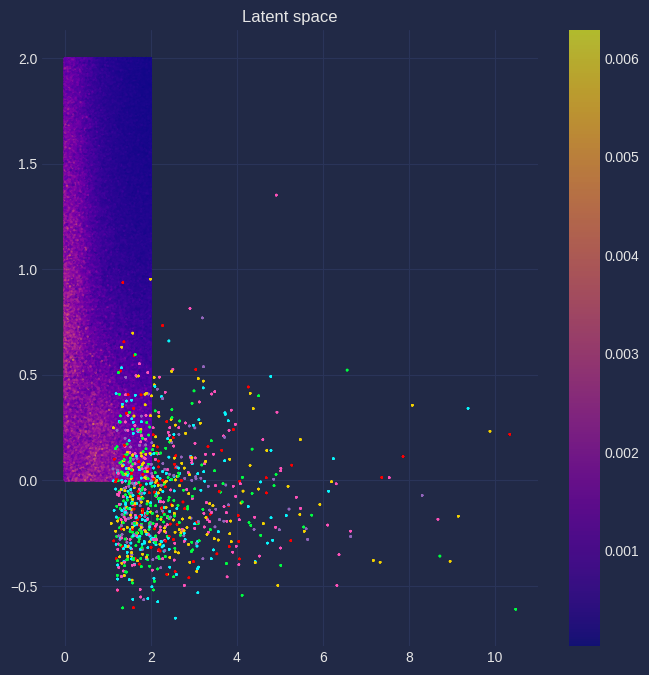

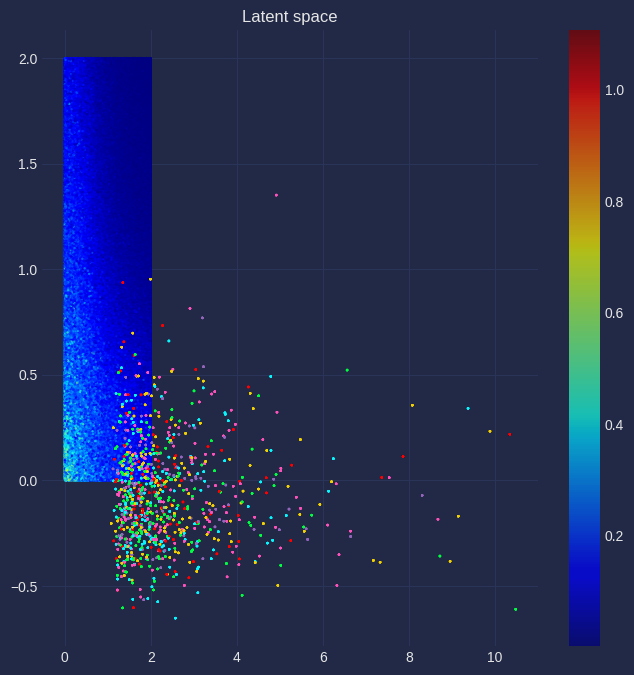

  0%|          | 1/200001 [03:02<10162:44:29, 182.93s/it]

    0:(beta)=(    0.8000)


  1%|          | 1001/200001 [06:34<11:40:24,  4.74it/s]

 1000:(beta)=(    0.9197)


  1%|          | 2001/200001 [10:05<11:40:09,  4.71it/s]

 2000:(beta)=(    0.6082)


  2%|▏         | 3001/200001 [13:37<11:37:11,  4.71it/s]

 3000:(beta)=(    0.9876)


  2%|▏         | 4001/200001 [17:09<11:30:03,  4.73it/s]

 4000:(beta)=(    0.6912)


  3%|▎         | 5001/200001 [20:41<11:27:15,  4.73it/s]

 5000:(beta)=(    0.7867)


  3%|▎         | 6001/200001 [24:12<11:23:48,  4.73it/s]

 6000:(beta)=(    0.9301)


  4%|▎         | 7001/200001 [27:44<11:20:34,  4.73it/s]

 7000:(beta)=(    0.6049)


  4%|▍         | 8001/200001 [31:16<11:15:26,  4.74it/s]

 8000:(beta)=(    0.9826)


  5%|▍         | 9001/200001 [34:47<11:13:14,  4.73it/s]

 9000:(beta)=(    0.7026)


  5%|▍         | 10000/200001 [38:19<11:15:02,  4.69it/s]

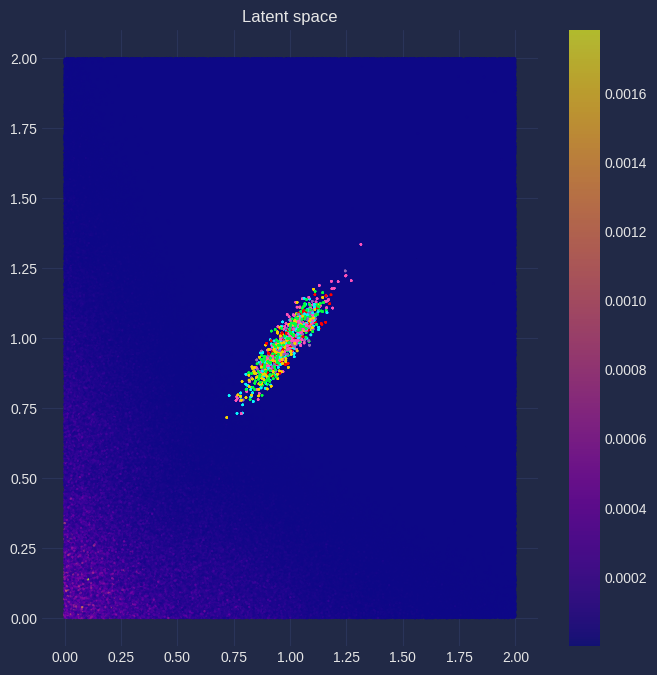

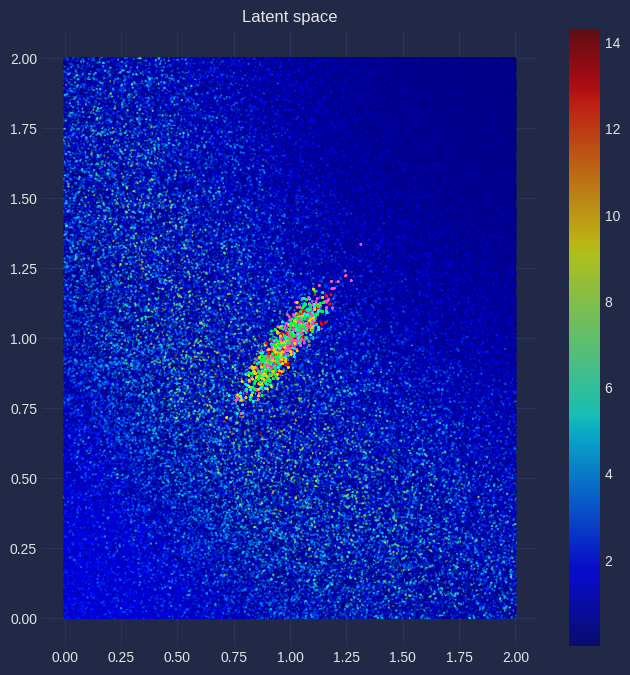

  5%|▌         | 10001/200001 [41:19<2862:11:59, 54.23s/it]

10000:(beta)=(    0.7735)


  6%|▌         | 11001/200001 [44:51<11:07:07,  4.72it/s]

11000:(beta)=(    0.9399)


  6%|▌         | 12001/200001 [48:22<11:01:09,  4.74it/s]

12000:(beta)=(    0.6024)


  7%|▋         | 13001/200001 [51:53<10:59:59,  4.72it/s]

13000:(beta)=(    0.9768)


  7%|▋         | 14001/200001 [55:24<10:56:09,  4.72it/s]

14000:(beta)=(    0.7144)


  8%|▊         | 15001/200001 [58:56<10:50:45,  4.74it/s]

15000:(beta)=(    0.7604)


  8%|▊         | 16001/200001 [1:02:27<10:47:39,  4.74it/s]

16000:(beta)=(    0.9490)


  9%|▊         | 17001/200001 [1:05:59<10:44:18,  4.73it/s]

17000:(beta)=(    0.6008)


  9%|▉         | 18001/200001 [1:09:30<10:40:10,  4.74it/s]

18000:(beta)=(    0.9702)


 10%|▉         | 19001/200001 [1:13:02<10:39:07,  4.72it/s]

19000:(beta)=(    0.7266)


 10%|▉         | 20000/200001 [1:16:33<10:40:11,  4.69it/s]

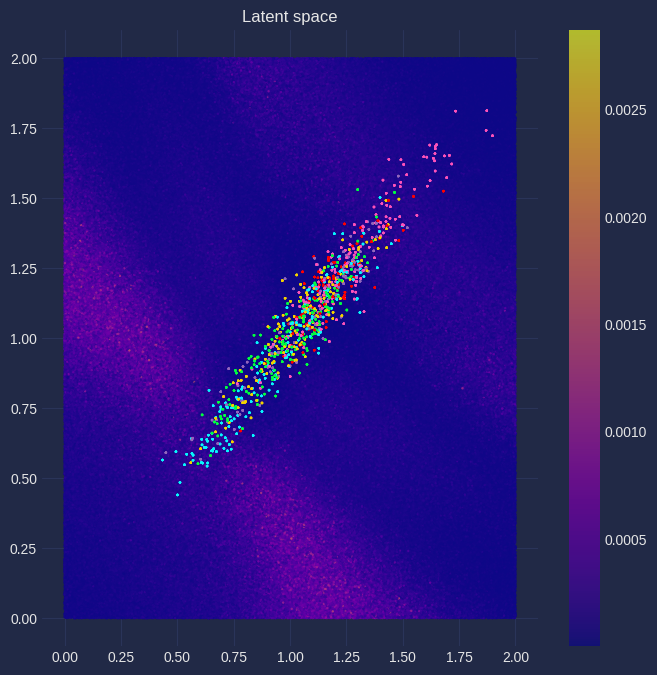

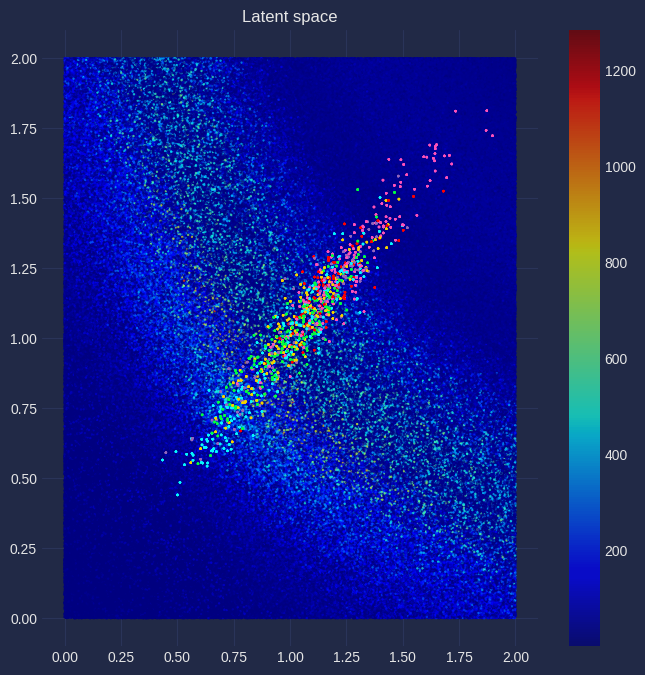

 10%|█         | 20001/200001 [1:19:32<2688:19:40, 53.77s/it]

20000:(beta)=(    0.7475)


 11%|█         | 21001/200001 [1:23:03<10:29:49,  4.74it/s]

21000:(beta)=(    0.9576)


 11%|█         | 22001/200001 [1:26:35<10:28:00,  4.72it/s]

22000:(beta)=(    0.6000)


 12%|█▏        | 23001/200001 [1:30:06<10:22:01,  4.74it/s]

23000:(beta)=(    0.9628)


 12%|█▏        | 24001/200001 [1:33:38<10:21:01,  4.72it/s]

24000:(beta)=(    0.7391)


 13%|█▎        | 25001/200001 [1:37:09<10:15:50,  4.74it/s]

25000:(beta)=(    0.7348)


 13%|█▎        | 26001/200001 [1:40:41<10:11:47,  4.74it/s]

26000:(beta)=(    0.9654)


 14%|█▎        | 27001/200001 [1:44:12<10:09:05,  4.73it/s]

27000:(beta)=(    0.6002)


 14%|█▍        | 28001/200001 [1:47:43<10:03:03,  4.75it/s]

28000:(beta)=(    0.9547)


 15%|█▍        | 29001/200001 [1:51:14<10:03:52,  4.72it/s]

29000:(beta)=(    0.7519)


 15%|█▍        | 30000/200001 [1:54:45<9:56:20,  4.75it/s]

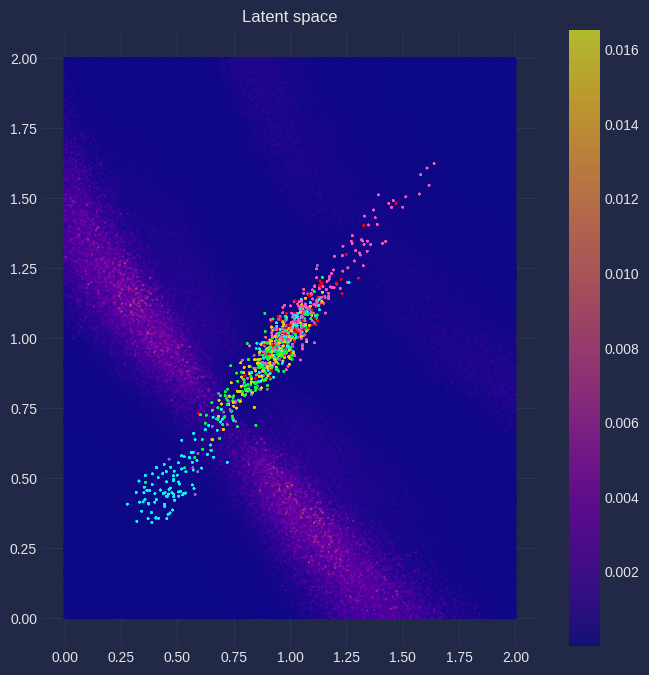

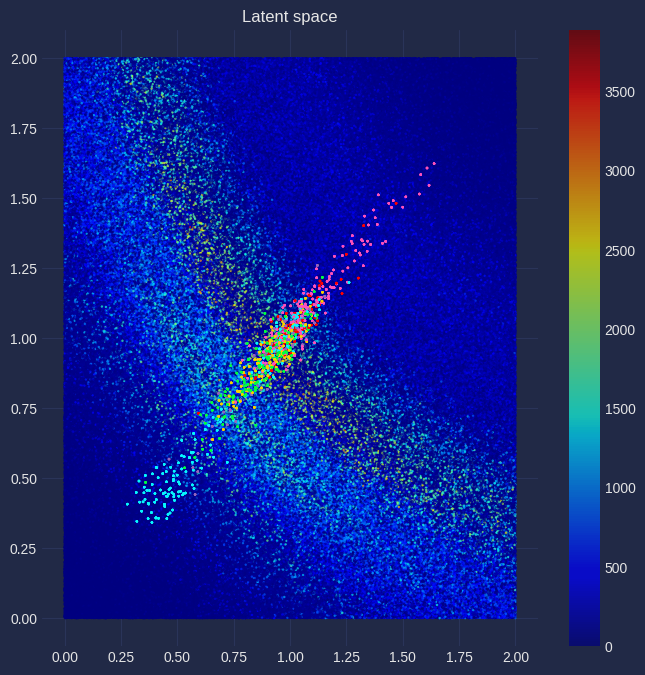

 15%|█▌        | 30001/200001 [1:57:44<2532:00:48, 53.62s/it]

30000:(beta)=(    0.7224)


 16%|█▌        | 31001/200001 [2:01:15<9:53:32,  4.75it/s]

31000:(beta)=(    0.9725)


 16%|█▌        | 32001/200001 [2:04:46<9:51:10,  4.74it/s]

32000:(beta)=(    0.6012)


 17%|█▋        | 33001/200001 [2:08:18<9:46:59,  4.74it/s]

33000:(beta)=(    0.9460)


 17%|█▋        | 34001/200001 [2:11:49<9:44:52,  4.73it/s]

34000:(beta)=(    0.7649)


 18%|█▊        | 35001/200001 [2:15:20<9:40:53,  4.73it/s]

35000:(beta)=(    0.7103)


 18%|█▊        | 36001/200001 [2:18:51<9:37:36,  4.73it/s]

36000:(beta)=(    0.9788)


 19%|█▊        | 37001/200001 [2:22:23<9:34:09,  4.73it/s]

37000:(beta)=(    0.6031)


 19%|█▉        | 38001/200001 [2:25:54<9:28:45,  4.75it/s]

38000:(beta)=(    0.9366)


 20%|█▉        | 39001/200001 [2:29:25<9:27:39,  4.73it/s]

39000:(beta)=(    0.7780)


 20%|█▉        | 40000/200001 [2:32:56<9:21:36,  4.75it/s]

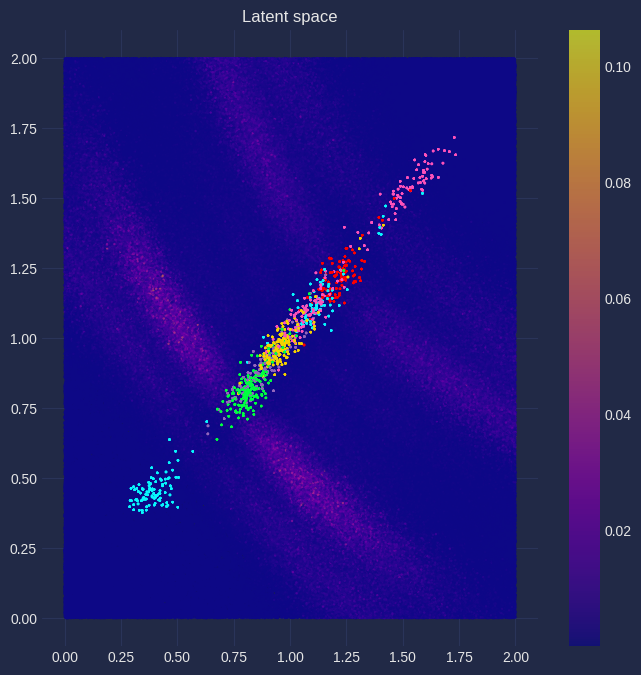

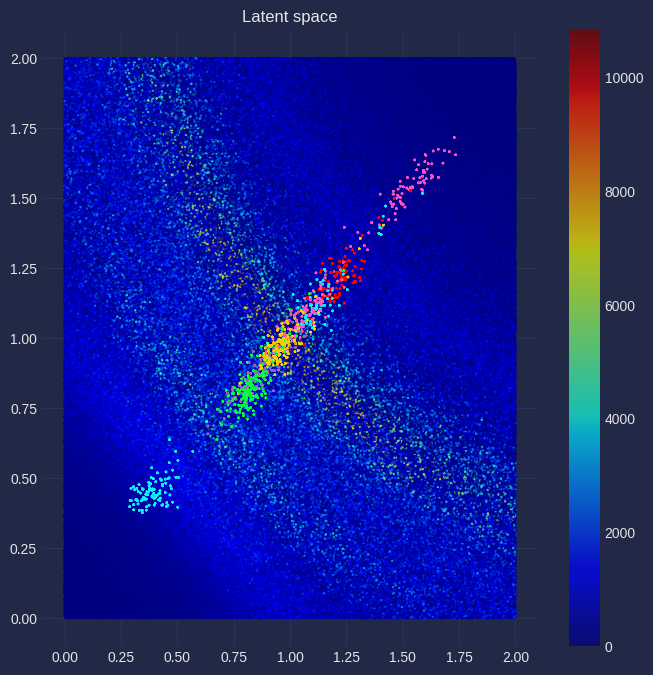

 20%|██        | 40001/200001 [2:35:53<2362:41:49, 53.16s/it]

40000:(beta)=(    0.6986)


 21%|██        | 41001/200001 [2:39:24<9:20:23,  4.73it/s]

41000:(beta)=(    0.9844)


 21%|██        | 42001/200001 [2:42:55<9:16:01,  4.74it/s]

42000:(beta)=(    0.6059)


 22%|██▏       | 43001/200001 [2:46:27<9:14:14,  4.72it/s]

43000:(beta)=(    0.9266)


 22%|██▏       | 44001/200001 [2:49:58<9:08:30,  4.74it/s]

44000:(beta)=(    0.7913)


 23%|██▎       | 45001/200001 [2:53:29<9:11:06,  4.69it/s]

45000:(beta)=(    0.6874)


 23%|██▎       | 46001/200001 [2:57:01<9:01:35,  4.74it/s]

46000:(beta)=(    0.9891)


 24%|██▎       | 47001/200001 [3:00:32<8:57:43,  4.74it/s]

47000:(beta)=(    0.6096)


 24%|██▍       | 48001/200001 [3:04:04<8:54:53,  4.74it/s]

48000:(beta)=(    0.9160)


 25%|██▍       | 49001/200001 [3:07:35<8:51:14,  4.74it/s]

49000:(beta)=(    0.8045)


 25%|██▍       | 50000/200001 [3:11:06<8:47:18,  4.74it/s]

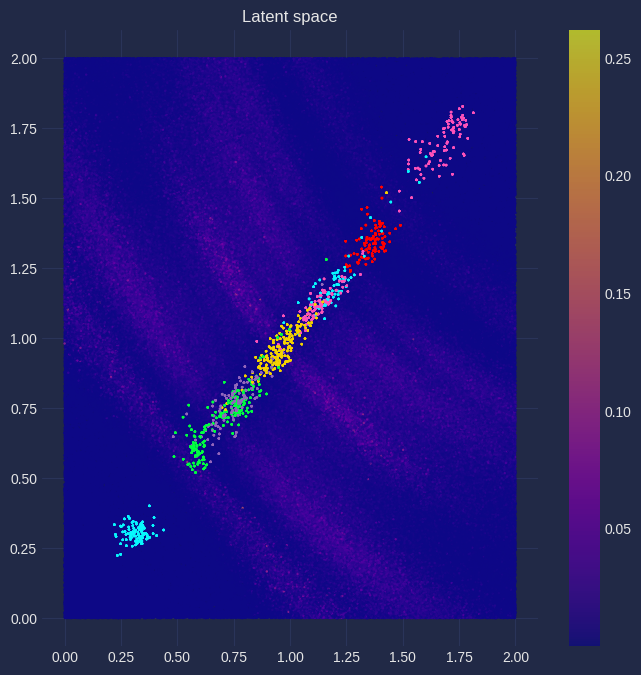

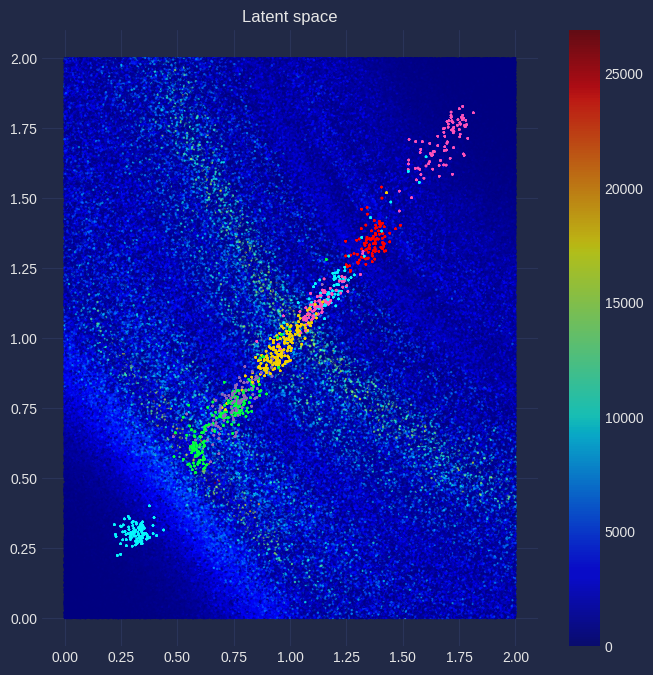

 25%|██▌       | 50001/200001 [3:14:03<2219:12:20, 53.26s/it]

50000:(beta)=(    0.6767)


 26%|██▌       | 51001/200001 [3:17:34<8:43:58,  4.74it/s]

51000:(beta)=(    0.9930)


 26%|██▌       | 52001/200001 [3:21:06<8:41:58,  4.73it/s]

52000:(beta)=(    0.6140)


 27%|██▋       | 53001/200001 [3:24:37<8:37:03,  4.74it/s]

53000:(beta)=(    0.9050)


 27%|██▋       | 54001/200001 [3:28:08<8:33:51,  4.74it/s]

54000:(beta)=(    0.8178)


 28%|██▊       | 55001/200001 [3:31:39<8:30:10,  4.74it/s]

55000:(beta)=(    0.6665)


 28%|██▊       | 56001/200001 [3:35:10<8:32:32,  4.68it/s]

56000:(beta)=(    0.9961)


 29%|██▊       | 57001/200001 [3:38:42<8:23:26,  4.73it/s]

57000:(beta)=(    0.6193)


 29%|██▉       | 58001/200001 [3:42:13<8:20:55,  4.72it/s]

58000:(beta)=(    0.8934)


 30%|██▉       | 59001/200001 [3:45:45<8:16:37,  4.73it/s]

59000:(beta)=(    0.8310)


 30%|██▉       | 60000/200001 [3:49:16<8:14:36,  4.72it/s]

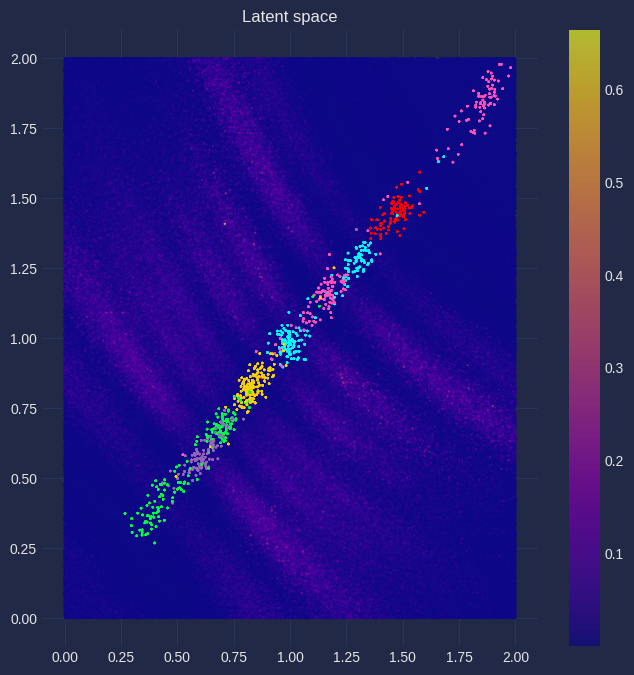

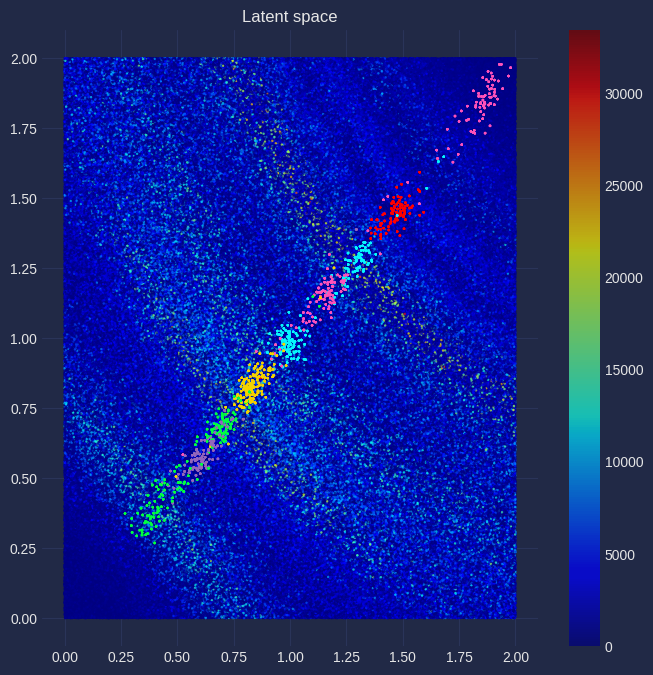

 30%|███       | 60001/200001 [3:52:13<2076:05:13, 53.39s/it]

60000:(beta)=(    0.6569)


 31%|███       | 61001/200001 [3:55:45<8:08:27,  4.74it/s]

61000:(beta)=(    0.9983)


 31%|███       | 62001/200001 [3:59:17<8:08:37,  4.71it/s]

62000:(beta)=(    0.6254)


 32%|███▏      | 63001/200001 [4:02:48<8:02:58,  4.73it/s]

63000:(beta)=(    0.8815)


 32%|███▏      | 64001/200001 [4:06:19<7:59:26,  4.73it/s]

64000:(beta)=(    0.8440)


 33%|███▎      | 65001/200001 [4:09:51<7:58:39,  4.70it/s]

65000:(beta)=(    0.6480)


 33%|███▎      | 66001/200001 [4:13:22<7:51:29,  4.74it/s]

66000:(beta)=(    0.9996)


 34%|███▎      | 67001/200001 [4:16:54<7:49:09,  4.72it/s]

67000:(beta)=(    0.6323)


 34%|███▍      | 68001/200001 [4:20:25<7:44:55,  4.73it/s]

68000:(beta)=(    0.8692)


 35%|███▍      | 69001/200001 [4:23:57<7:41:59,  4.73it/s]

69000:(beta)=(    0.8569)


 35%|███▍      | 70000/200001 [4:27:28<7:41:04,  4.70it/s]

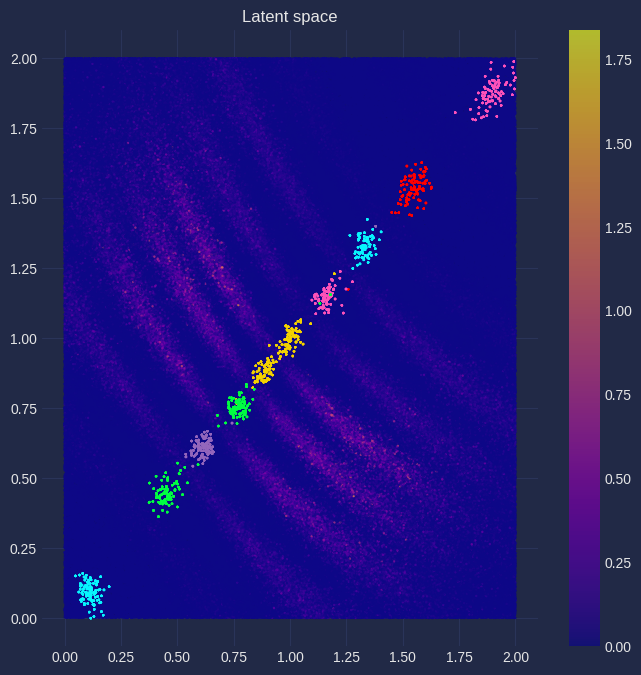

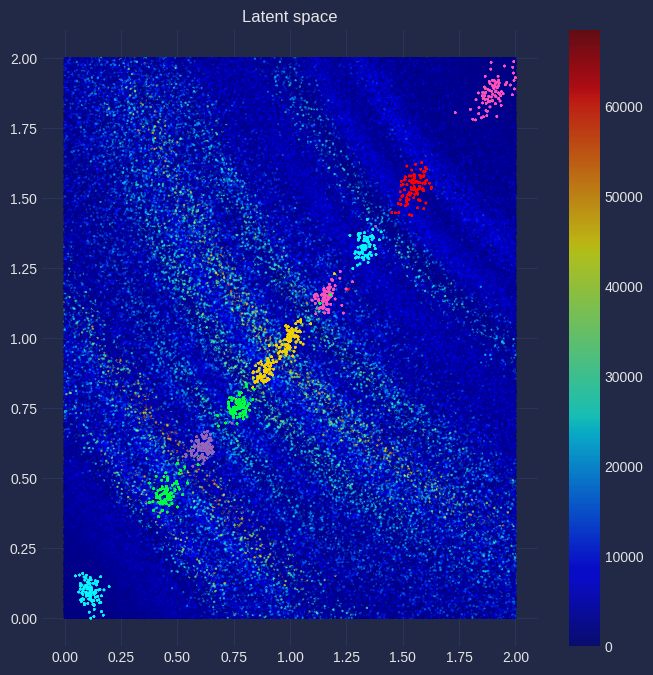

 35%|███▌      | 70001/200001 [4:30:27<1946:21:36, 53.90s/it]

70000:(beta)=(    0.6397)


 36%|███▌      | 71001/200001 [4:33:59<7:33:48,  4.74it/s]

71000:(beta)=(    1.0000)


 36%|███▌      | 72001/200001 [4:37:31<7:31:06,  4.73it/s]

72000:(beta)=(    0.6399)


 37%|███▋      | 73001/200001 [4:41:02<7:31:46,  4.69it/s]

73000:(beta)=(    0.8566)


 37%|███▋      | 74001/200001 [4:44:34<7:24:47,  4.72it/s]

74000:(beta)=(    0.8695)


 38%|███▊      | 75001/200001 [4:48:06<7:20:10,  4.73it/s]

75000:(beta)=(    0.6321)


 38%|███▊      | 76001/200001 [4:51:38<7:17:05,  4.73it/s]

76000:(beta)=(    0.9995)


 39%|███▊      | 77001/200001 [4:55:10<7:14:53,  4.71it/s]

77000:(beta)=(    0.6482)


 39%|███▉      | 78001/200001 [4:58:41<7:10:22,  4.72it/s]

78000:(beta)=(    0.8437)


 40%|███▉      | 79001/200001 [5:02:13<7:07:24,  4.72it/s]

79000:(beta)=(    0.8818)


 40%|███▉      | 80000/200001 [5:05:45<7:03:41,  4.72it/s]

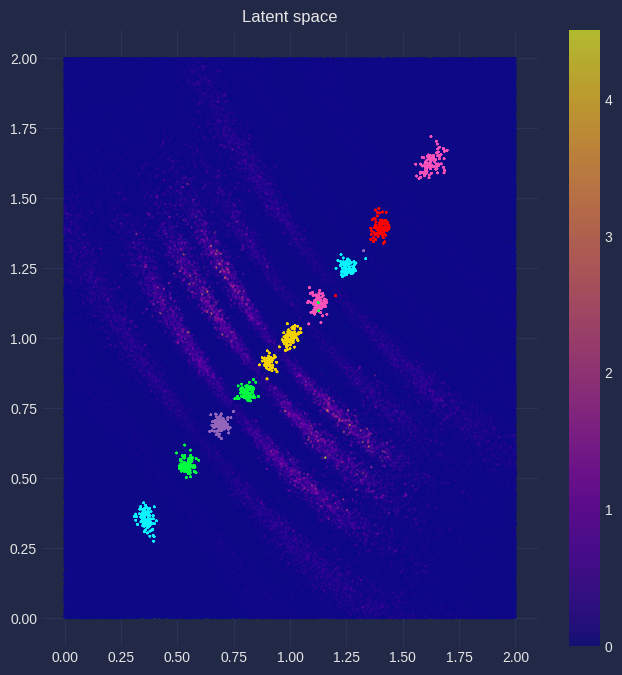

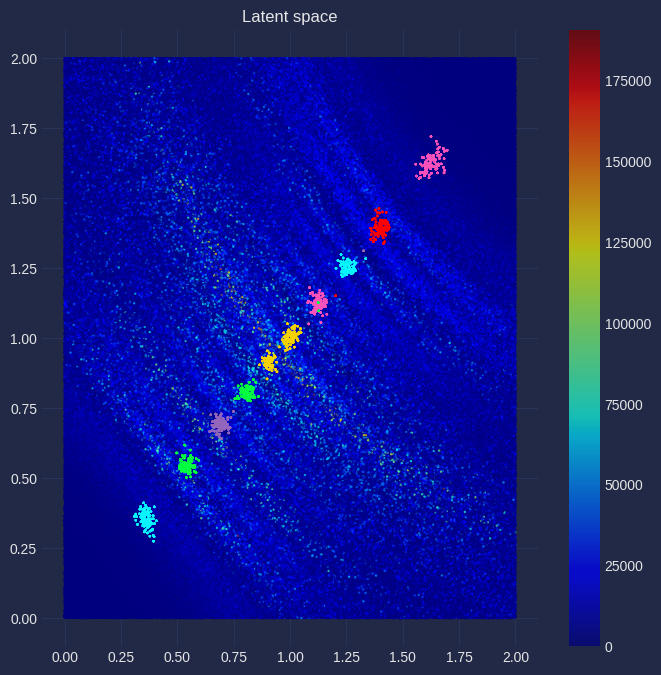

 40%|████      | 80001/200001 [5:08:44<1791:53:23, 53.76s/it]

80000:(beta)=(    0.6252)


 41%|████      | 81001/200001 [5:12:16<7:02:16,  4.70it/s]

81000:(beta)=(    0.9982)


 41%|████      | 82001/200001 [5:15:48<6:56:20,  4.72it/s]

82000:(beta)=(    0.6572)


 42%|████▏     | 83001/200001 [5:19:20<6:55:48,  4.69it/s]

83000:(beta)=(    0.8306)


 42%|████▏     | 84001/200001 [5:22:52<6:47:58,  4.74it/s]

84000:(beta)=(    0.8937)


 43%|████▎     | 85001/200001 [5:26:24<6:48:00,  4.70it/s]

85000:(beta)=(    0.6192)


 43%|████▎     | 86001/200001 [5:29:56<6:43:56,  4.70it/s]

86000:(beta)=(    0.9960)


 44%|████▎     | 87001/200001 [5:33:28<6:38:58,  4.72it/s]

87000:(beta)=(    0.6668)


 44%|████▍     | 88001/200001 [5:37:00<6:36:44,  4.70it/s]

88000:(beta)=(    0.8175)


 45%|████▍     | 89001/200001 [5:40:32<6:33:57,  4.70it/s]

89000:(beta)=(    0.9053)


 45%|████▍     | 90000/200001 [5:44:04<6:28:27,  4.72it/s]

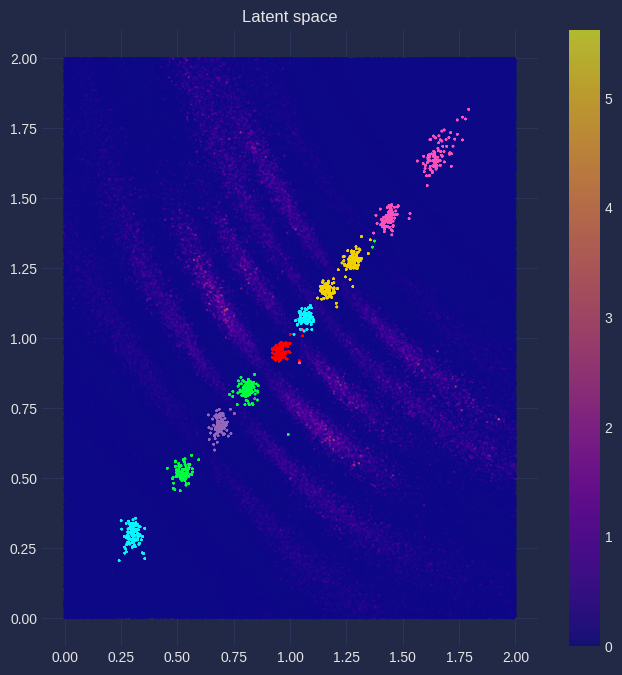

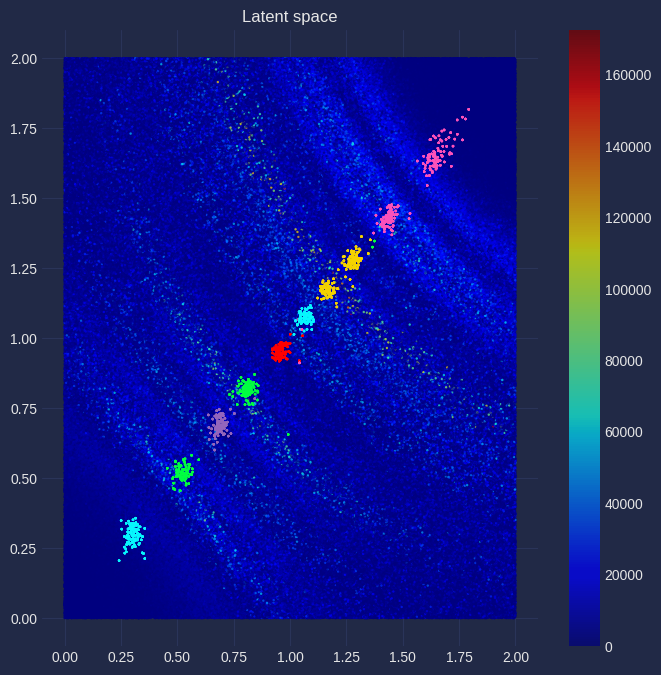

 45%|████▌     | 90001/200001 [5:47:04<1653:29:52, 54.11s/it]

90000:(beta)=(    0.6139)


 46%|████▌     | 91001/200001 [5:50:36<6:25:52,  4.71it/s]

91000:(beta)=(    0.9929)


 46%|████▌     | 92001/200001 [5:54:08<6:21:54,  4.71it/s]

92000:(beta)=(    0.6770)


 47%|████▋     | 93001/200001 [5:57:40<6:16:56,  4.73it/s]

93000:(beta)=(    0.8042)


 47%|████▋     | 94001/200001 [6:01:12<6:15:13,  4.71it/s]

94000:(beta)=(    0.9163)


 48%|████▊     | 95001/200001 [6:04:45<6:12:50,  4.69it/s]

95000:(beta)=(    0.6094)


 48%|████▊     | 96001/200001 [6:08:17<6:05:34,  4.74it/s]

96000:(beta)=(    0.9890)


 49%|████▊     | 97001/200001 [6:11:50<6:02:59,  4.73it/s]

97000:(beta)=(    0.6877)


 49%|████▉     | 98001/200001 [6:15:22<6:02:52,  4.68it/s]

98000:(beta)=(    0.7909)


 50%|████▉     | 99001/200001 [6:18:54<5:57:05,  4.71it/s]

99000:(beta)=(    0.9269)


 50%|████▉     | 100000/200001 [6:22:26<5:55:16,  4.69it/s]

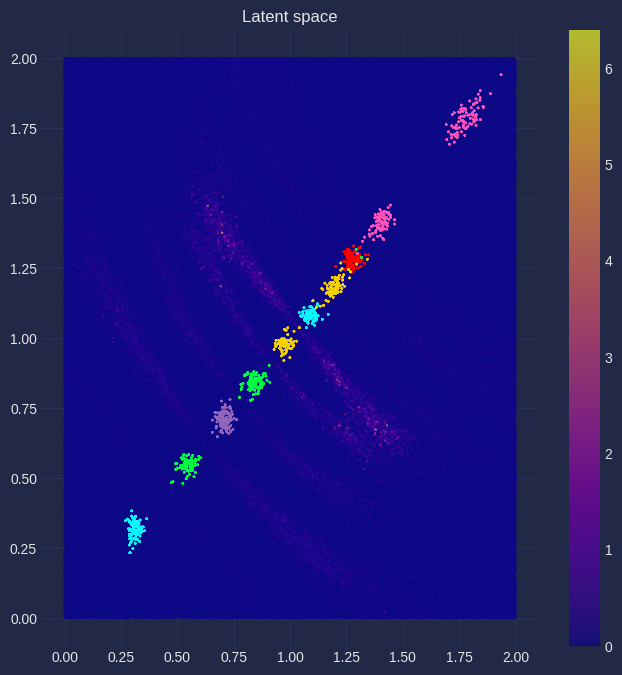

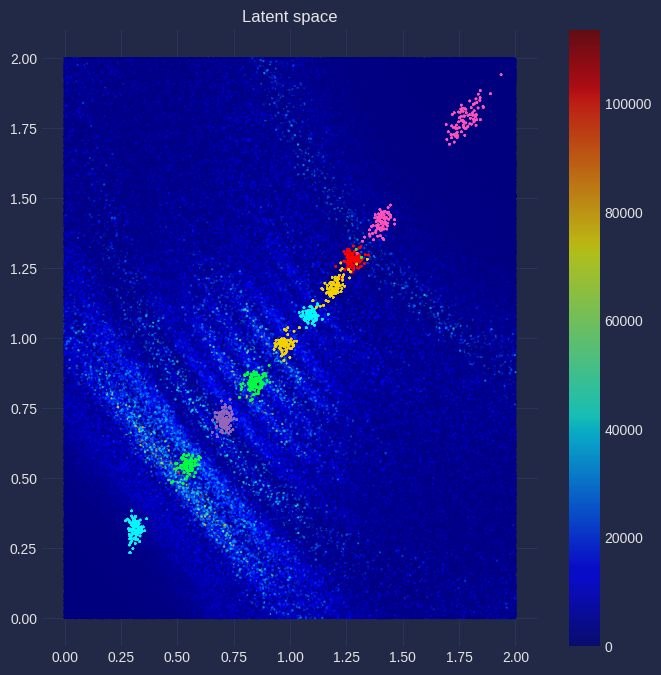

 50%|█████     | 100001/200001 [6:25:24<1487:14:48, 53.54s/it]

100000:(beta)=(    0.6058)


 51%|█████     | 101001/200001 [6:28:56<5:50:20,  4.71it/s]

101000:(beta)=(    0.9843)


 51%|█████     | 102001/200001 [6:32:28<5:48:04,  4.69it/s]

102000:(beta)=(    0.6989)


 52%|█████▏    | 103001/200001 [6:36:01<5:43:19,  4.71it/s]

103000:(beta)=(    0.7777)


 52%|█████▏    | 104001/200001 [6:39:33<5:38:18,  4.73it/s]

104000:(beta)=(    0.9368)


 53%|█████▎    | 105001/200001 [6:43:05<5:35:28,  4.72it/s]

105000:(beta)=(    0.6031)


 53%|█████▎    | 106001/200001 [6:46:37<5:31:26,  4.73it/s]

106000:(beta)=(    0.9787)


 54%|█████▎    | 107001/200001 [6:50:10<5:28:24,  4.72it/s]

107000:(beta)=(    0.7106)


 54%|█████▍    | 108001/200001 [6:53:42<5:25:08,  4.72it/s]

108000:(beta)=(    0.7645)


 55%|█████▍    | 109001/200001 [6:57:14<5:23:00,  4.70it/s]

109000:(beta)=(    0.9462)


 55%|█████▍    | 110000/200001 [7:00:47<5:17:32,  4.72it/s]

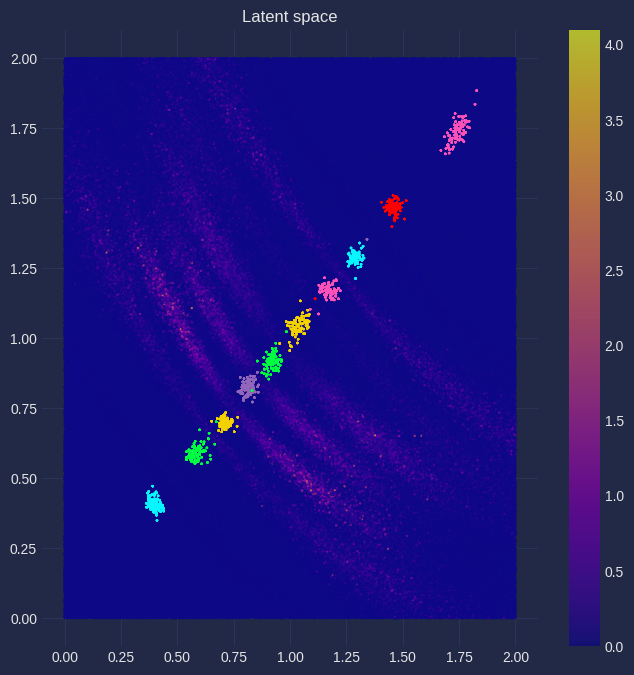

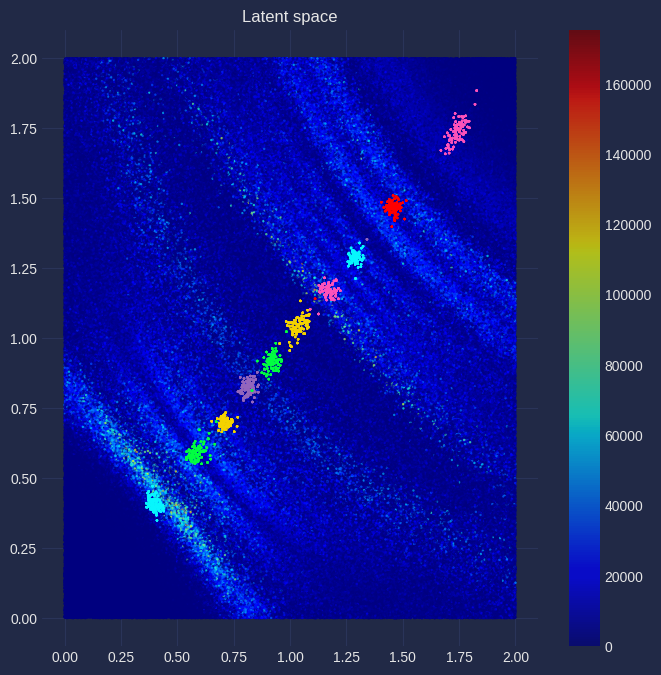

 55%|█████▌    | 110001/200001 [7:03:45<1343:36:35, 53.74s/it]

110000:(beta)=(    0.6012)


 56%|█████▌    | 111001/200001 [7:07:17<5:15:08,  4.71it/s]

111000:(beta)=(    0.9723)


 56%|█████▌    | 112001/200001 [7:10:50<5:11:02,  4.72it/s]

112000:(beta)=(    0.7227)


 57%|█████▋    | 113001/200001 [7:14:22<5:09:52,  4.68it/s]

113000:(beta)=(    0.7515)


 57%|█████▋    | 114001/200001 [7:17:54<5:04:51,  4.70it/s]

114000:(beta)=(    0.9550)


 58%|█████▊    | 115001/200001 [7:21:27<5:02:19,  4.69it/s]

115000:(beta)=(    0.6002)


 58%|█████▊    | 116001/200001 [7:24:59<4:56:56,  4.71it/s]

116000:(beta)=(    0.9652)


 59%|█████▊    | 117001/200001 [7:28:32<4:54:55,  4.69it/s]

117000:(beta)=(    0.7351)


 59%|█████▉    | 118001/200001 [7:32:04<4:49:52,  4.71it/s]

118000:(beta)=(    0.7388)


 60%|█████▉    | 119001/200001 [7:35:37<4:46:54,  4.71it/s]

119000:(beta)=(    0.9630)


 60%|█████▉    | 120000/200001 [7:39:09<4:43:31,  4.70it/s]

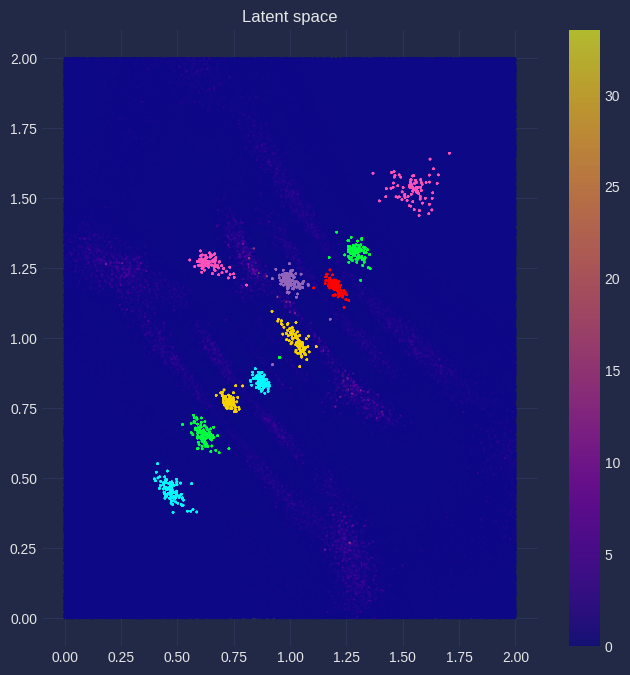

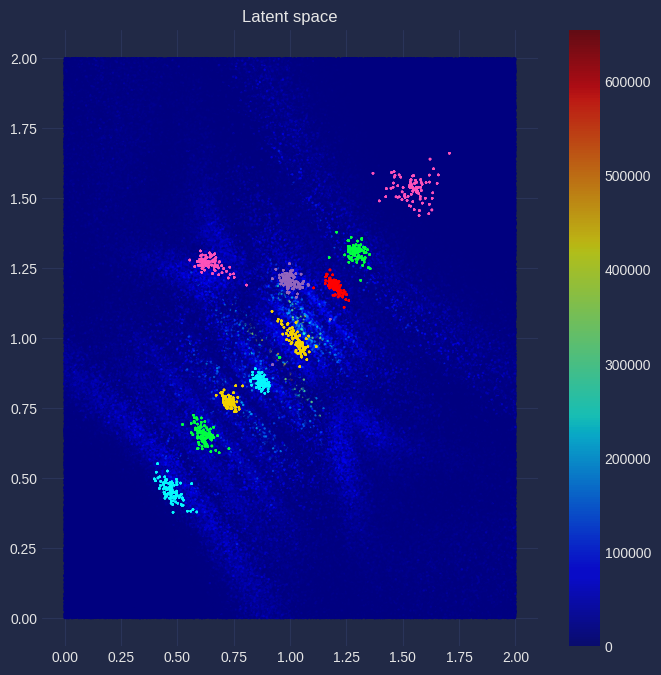

 60%|██████    | 120001/200001 [7:42:07<1191:18:40, 53.61s/it]

120000:(beta)=(    0.6001)


 61%|██████    | 121001/200001 [7:45:39<4:39:12,  4.72it/s]

121000:(beta)=(    0.9574)


 61%|██████    | 122001/200001 [7:49:12<4:36:40,  4.70it/s]

122000:(beta)=(    0.7478)


 62%|██████▏   | 123001/200001 [7:52:44<4:31:24,  4.73it/s]

123000:(beta)=(    0.7263)


 62%|██████▏   | 124001/200001 [7:56:16<4:30:45,  4.68it/s]

124000:(beta)=(    0.9703)


 63%|██████▎   | 125001/200001 [7:59:48<4:25:16,  4.71it/s]

125000:(beta)=(    0.6008)


 63%|██████▎   | 126001/200001 [8:03:20<4:22:08,  4.70it/s]

126000:(beta)=(    0.9488)


 64%|██████▎   | 127001/200001 [8:06:52<4:20:14,  4.68it/s]

127000:(beta)=(    0.7607)


 64%|██████▍   | 128001/200001 [8:10:24<4:14:17,  4.72it/s]

128000:(beta)=(    0.7141)


 65%|██████▍   | 129001/200001 [8:13:56<4:09:41,  4.74it/s]

129000:(beta)=(    0.9769)


 65%|██████▍   | 130000/200001 [8:17:28<4:07:08,  4.72it/s]

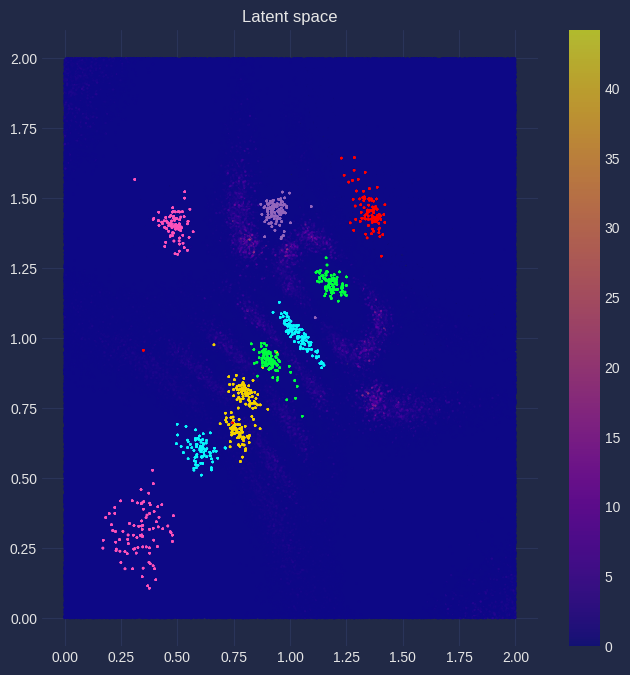

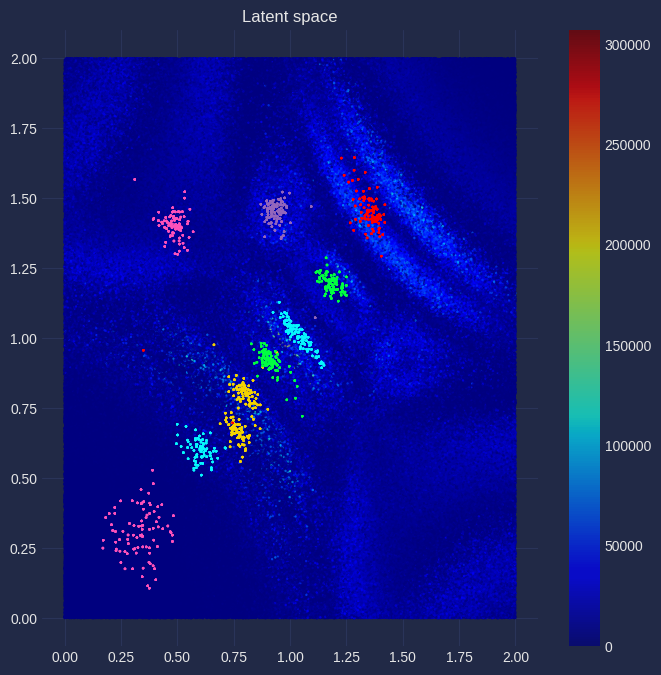

 65%|██████▌   | 130001/200001 [8:20:26<1044:30:25, 53.72s/it]

130000:(beta)=(    0.6024)


 66%|██████▌   | 131001/200001 [8:23:59<4:06:28,  4.67it/s]

131000:(beta)=(    0.9396)


 66%|██████▌   | 132001/200001 [8:27:31<3:59:41,  4.73it/s]

132000:(beta)=(    0.7739)


 67%|██████▋   | 133001/200001 [8:31:03<3:57:05,  4.71it/s]

133000:(beta)=(    0.7023)


 67%|██████▋   | 134001/200001 [8:34:35<3:53:24,  4.71it/s]

134000:(beta)=(    0.9827)


 68%|██████▊   | 135001/200001 [8:38:08<3:49:54,  4.71it/s]

135000:(beta)=(    0.6049)


 68%|██████▊   | 136001/200001 [8:41:40<3:47:22,  4.69it/s]

136000:(beta)=(    0.9298)


 69%|██████▊   | 137001/200001 [8:45:12<3:42:54,  4.71it/s]

137000:(beta)=(    0.7871)


 69%|██████▉   | 138001/200001 [8:48:45<3:39:10,  4.71it/s]

138000:(beta)=(    0.6909)


 70%|██████▉   | 139001/200001 [8:52:17<3:35:38,  4.71it/s]

139000:(beta)=(    0.9877)


 70%|██████▉   | 140000/200001 [8:55:49<3:30:58,  4.74it/s]

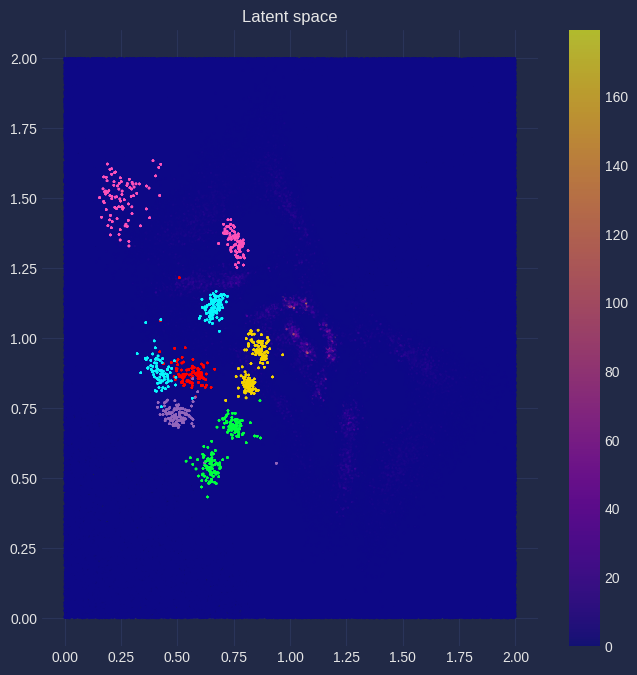

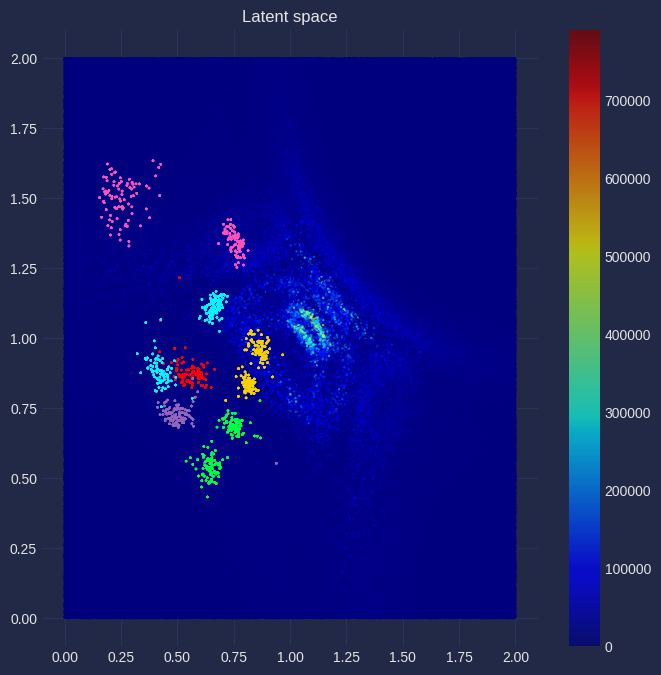

 70%|███████   | 140001/200001 [8:58:49<901:18:09, 54.08s/it]

140000:(beta)=(    0.6083)


 71%|███████   | 141001/200001 [9:02:21<3:29:57,  4.68it/s]

141000:(beta)=(    0.9194)


 71%|███████   | 142001/200001 [9:05:54<3:25:19,  4.71it/s]

142000:(beta)=(    0.8003)


 72%|███████▏  | 143001/200001 [9:09:25<3:23:07,  4.68it/s]

143000:(beta)=(    0.6800)


 72%|███████▏  | 144001/200001 [9:12:58<3:18:09,  4.71it/s]

144000:(beta)=(    0.9919)


 73%|███████▎  | 145001/200001 [9:16:30<3:13:58,  4.73it/s]

145000:(beta)=(    0.6125)


 73%|███████▎  | 146001/200001 [9:20:02<3:11:26,  4.70it/s]

146000:(beta)=(    0.9085)


 74%|███████▎  | 147001/200001 [9:23:34<3:06:32,  4.74it/s]

147000:(beta)=(    0.8136)


 74%|███████▍  | 148001/200001 [9:27:06<3:04:10,  4.71it/s]

148000:(beta)=(    0.6697)


 75%|███████▍  | 149001/200001 [9:30:38<3:00:16,  4.72it/s]

149000:(beta)=(    0.9952)


 75%|███████▍  | 150000/200001 [9:34:10<2:56:36,  4.72it/s]

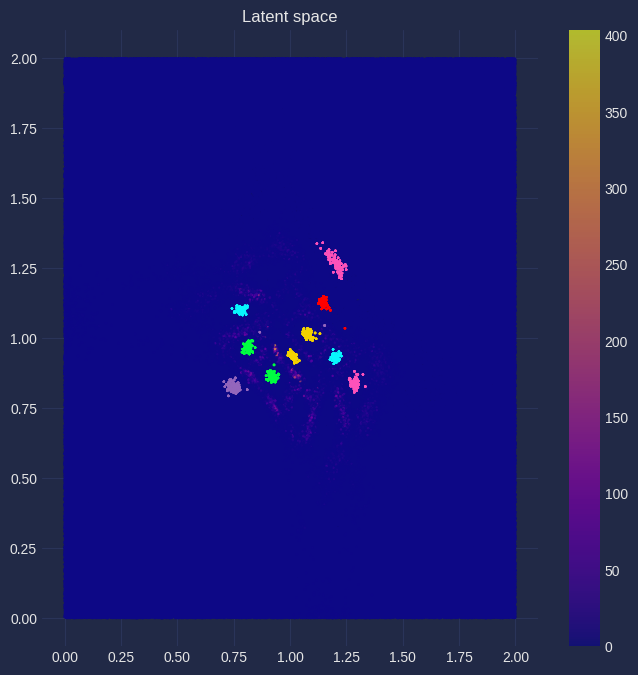

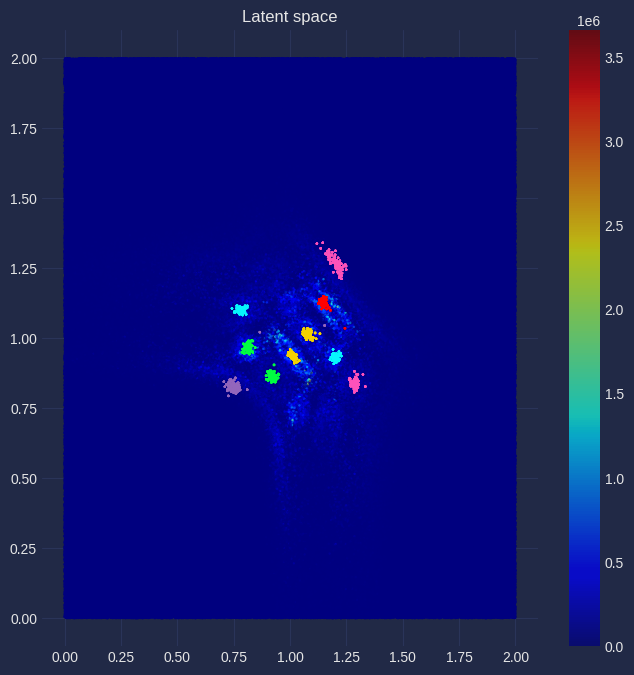

 75%|███████▌  | 150001/200001 [9:37:09<748:02:15, 53.86s/it]

150000:(beta)=(    0.6176)


 76%|███████▌  | 151001/200001 [9:40:41<2:52:52,  4.72it/s]

151000:(beta)=(    0.8971)


 76%|███████▌  | 152001/200001 [9:44:13<2:49:53,  4.71it/s]

152000:(beta)=(    0.8268)


 77%|███████▋  | 153001/200001 [9:47:45<2:45:31,  4.73it/s]

153000:(beta)=(    0.6599)


 77%|███████▋  | 154001/200001 [9:51:17<2:43:11,  4.70it/s]

154000:(beta)=(    0.9977)


 78%|███████▊  | 155001/200001 [9:54:49<2:38:34,  4.73it/s]

155000:(beta)=(    0.6234)


 78%|███████▊  | 156001/200001 [9:58:21<2:35:31,  4.72it/s]

156000:(beta)=(    0.8853)


 79%|███████▊  | 157001/200001 [10:01:53<2:31:48,  4.72it/s]

157000:(beta)=(    0.8399)


 79%|███████▉  | 158001/200001 [10:05:25<2:29:48,  4.67it/s]

158000:(beta)=(    0.6507)


 80%|███████▉  | 159001/200001 [10:08:57<2:24:22,  4.73it/s]

159000:(beta)=(    0.9993)


 80%|███████▉  | 160000/200001 [10:12:29<2:21:07,  4.72it/s]

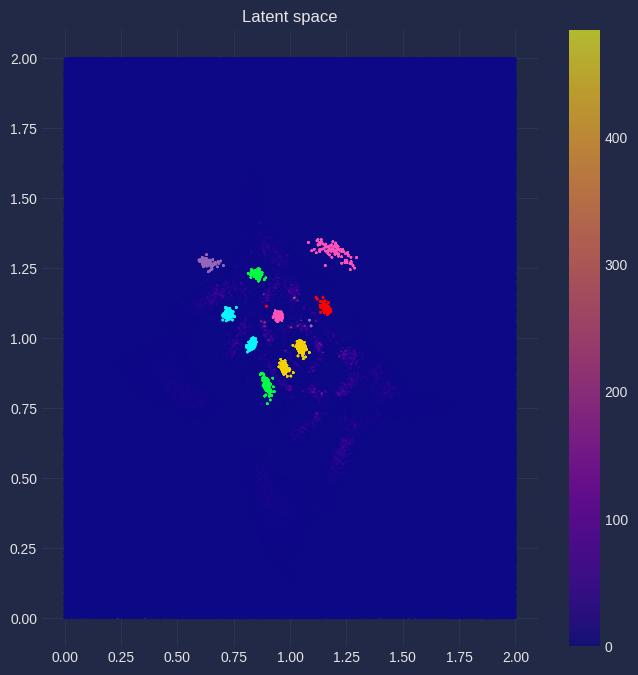

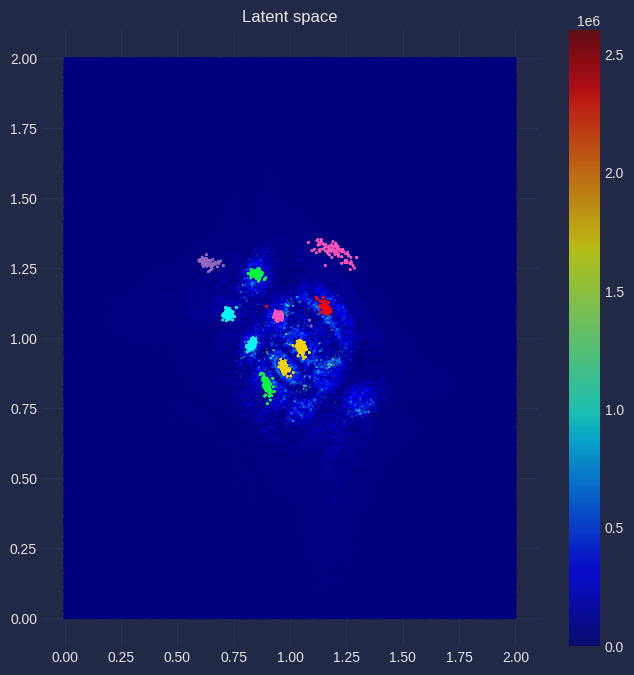

 80%|████████  | 160001/200001 [10:15:28<596:20:15, 53.67s/it]

160000:(beta)=(    0.6300)


 81%|████████  | 161001/200001 [10:19:00<2:17:31,  4.73it/s]

161000:(beta)=(    0.8731)


 81%|████████  | 162001/200001 [10:22:32<2:13:48,  4.73it/s]

162000:(beta)=(    0.8529)


 82%|████████▏ | 163001/200001 [10:26:04<2:10:27,  4.73it/s]

163000:(beta)=(    0.6422)


 82%|████████▏ | 164001/200001 [10:29:36<2:06:56,  4.73it/s]

164000:(beta)=(    1.0000)


 83%|████████▎ | 165001/200001 [10:33:08<2:05:12,  4.66it/s]

165000:(beta)=(    0.6374)


 83%|████████▎ | 166001/200001 [10:36:40<2:00:00,  4.72it/s]

166000:(beta)=(    0.8606)


 84%|████████▎ | 167001/200001 [10:40:12<1:56:35,  4.72it/s]

167000:(beta)=(    0.8655)


 84%|████████▍ | 168001/200001 [10:43:44<1:52:53,  4.72it/s]

168000:(beta)=(    0.6344)


 85%|████████▍ | 169001/200001 [10:47:16<1:49:32,  4.72it/s]

169000:(beta)=(    0.9998)


 85%|████████▍ | 170000/200001 [10:50:48<1:46:34,  4.69it/s]

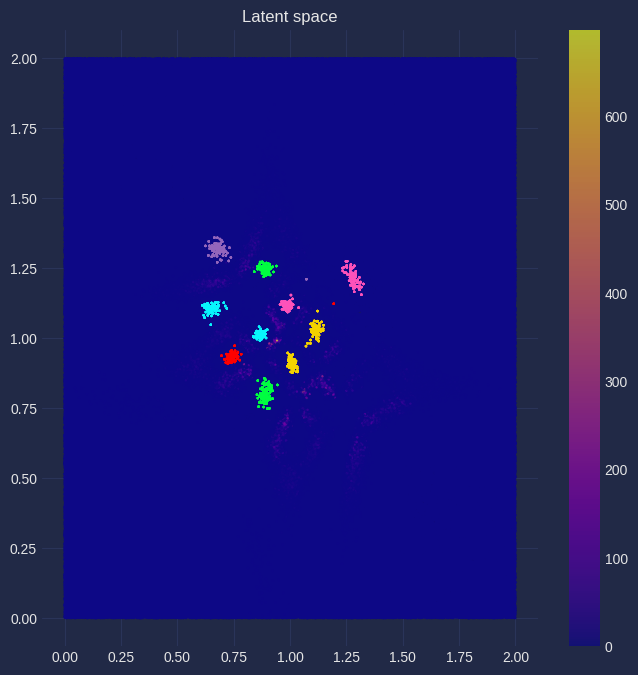

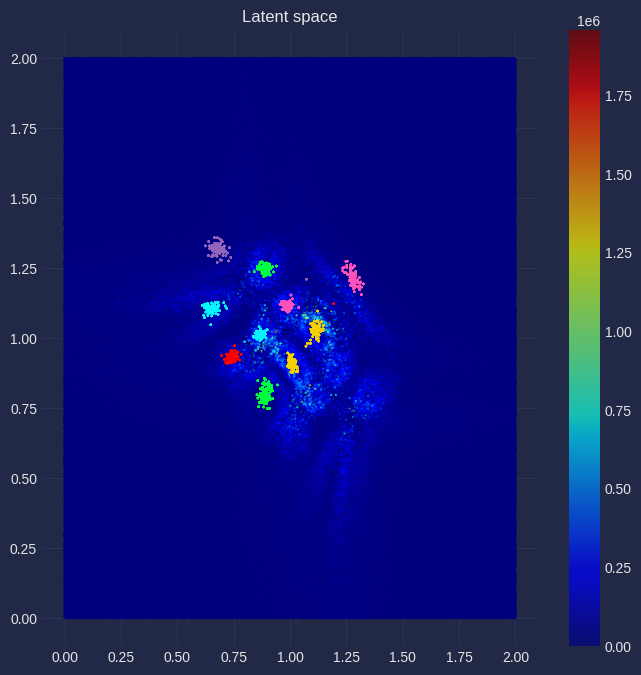

 85%|████████▌ | 170001/200001 [10:53:46<447:00:36, 53.64s/it]

170000:(beta)=(    0.6455)


 86%|████████▌ | 171001/200001 [10:57:18<1:42:03,  4.74it/s]

171000:(beta)=(    0.8478)


 86%|████████▌ | 172001/200001 [11:00:50<1:39:01,  4.71it/s]

172000:(beta)=(    0.8779)


 87%|████████▋ | 173001/200001 [11:04:22<1:35:04,  4.73it/s]

173000:(beta)=(    0.6273)


 87%|████████▋ | 174001/200001 [11:07:54<1:31:56,  4.71it/s]

174000:(beta)=(    0.9987)


 88%|████████▊ | 175001/200001 [11:11:26<1:27:58,  4.74it/s]

175000:(beta)=(    0.6543)


 88%|████████▊ | 176001/200001 [11:14:58<1:24:34,  4.73it/s]

176000:(beta)=(    0.8348)


 89%|████████▊ | 177001/200001 [11:18:30<1:21:15,  4.72it/s]

177000:(beta)=(    0.8900)


 89%|████████▉ | 178001/200001 [11:22:02<1:18:26,  4.67it/s]

178000:(beta)=(    0.6210)


 90%|████████▉ | 179001/200001 [11:25:34<1:13:56,  4.73it/s]

179000:(beta)=(    0.9968)


 90%|████████▉ | 180000/200001 [11:29:06<1:11:04,  4.69it/s]

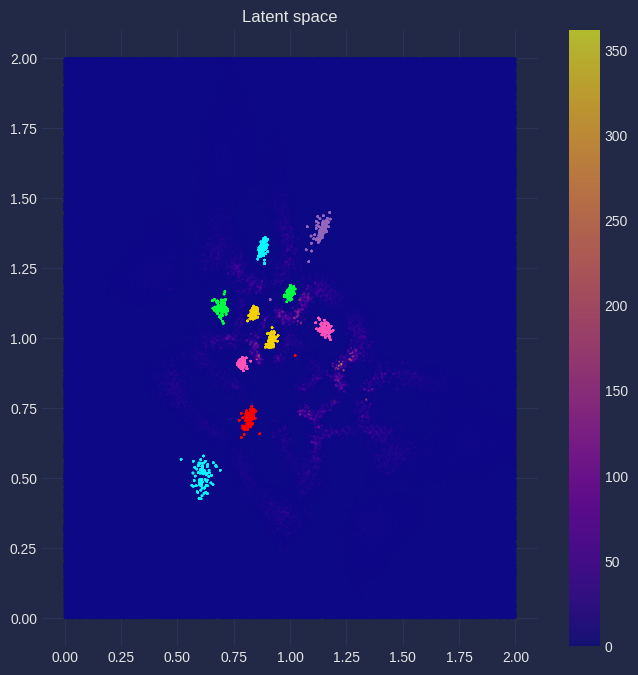

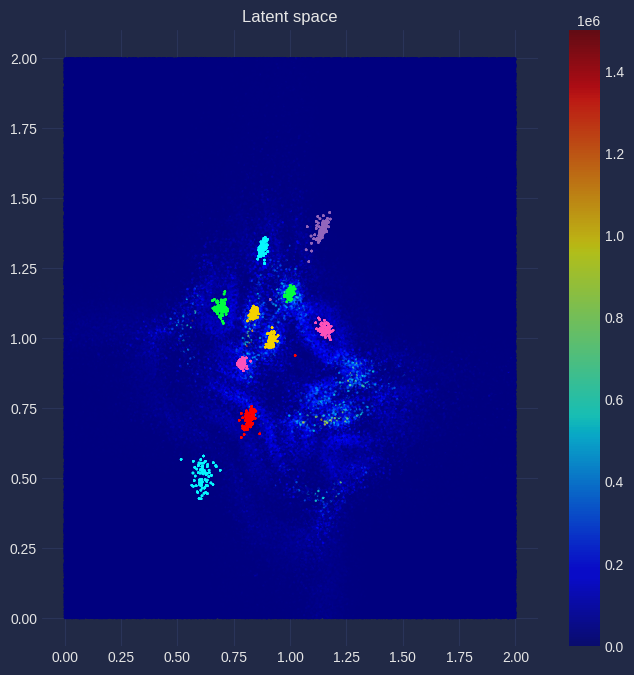

 90%|█████████ | 180001/200001 [11:32:02<295:11:03, 53.13s/it]

180000:(beta)=(    0.6637)


 91%|█████████ | 181001/200001 [11:35:34<1:07:15,  4.71it/s]

181000:(beta)=(    0.8216)


 91%|█████████ | 182001/200001 [11:39:06<1:03:34,  4.72it/s]

182000:(beta)=(    0.9017)


 92%|█████████▏| 183001/200001 [11:42:38<1:00:32,  4.68it/s]

183000:(beta)=(    0.6155)


 92%|█████████▏| 184001/200001 [11:46:10<56:28,  4.72it/s]

184000:(beta)=(    0.9940)


 93%|█████████▎| 185001/200001 [11:49:42<53:10,  4.70it/s]

185000:(beta)=(    0.6737)


 93%|█████████▎| 186001/200001 [11:53:14<49:24,  4.72it/s]

186000:(beta)=(    0.8084)


 94%|█████████▎| 187001/200001 [11:56:46<45:49,  4.73it/s]

187000:(beta)=(    0.9129)


 94%|█████████▍| 188001/200001 [12:00:18<42:37,  4.69it/s]

188000:(beta)=(    0.6108)


 95%|█████████▍| 189001/200001 [12:03:50<38:48,  4.72it/s]

189000:(beta)=(    0.9903)


 95%|█████████▍| 190000/200001 [12:07:22<35:18,  4.72it/s]

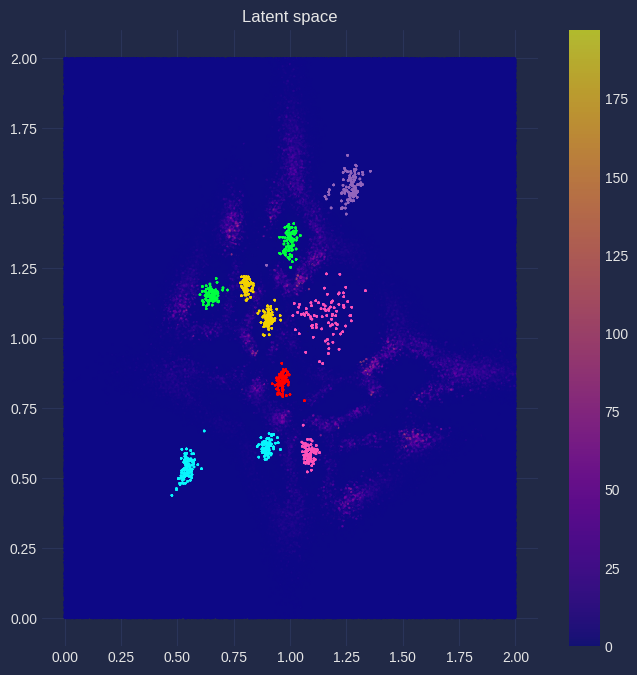

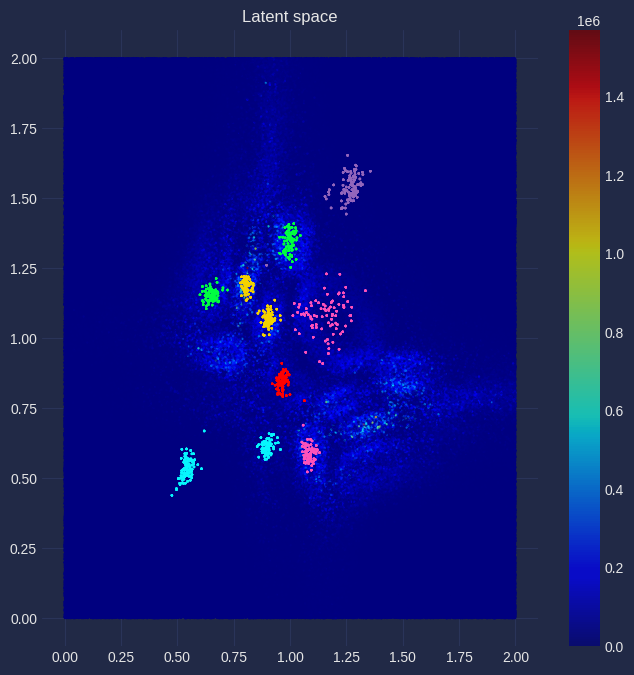

 95%|█████████▌| 190001/200001 [12:10:21<149:05:16, 53.67s/it]

190000:(beta)=(    0.6843)


 96%|█████████▌| 191001/200001 [12:13:52<31:47,  4.72it/s]

191000:(beta)=(    0.7951)


 96%|█████████▌| 192001/200001 [12:17:24<28:20,  4.70it/s]

192000:(beta)=(    0.9236)


 97%|█████████▋| 193001/200001 [12:20:56<24:35,  4.75it/s]

193000:(beta)=(    0.6069)


 97%|█████████▋| 194001/200001 [12:24:28<21:03,  4.75it/s]

194000:(beta)=(    0.9858)


 98%|█████████▊| 195001/200001 [12:28:00<17:37,  4.73it/s]

195000:(beta)=(    0.6953)


 98%|█████████▊| 196001/200001 [12:31:32<14:13,  4.69it/s]

196000:(beta)=(    0.7818)


 99%|█████████▊| 197001/200001 [12:35:04<10:35,  4.72it/s]

197000:(beta)=(    0.9337)


 99%|█████████▉| 198001/200001 [12:38:36<07:02,  4.74it/s]

198000:(beta)=(    0.6039)


100%|█████████▉| 199001/200001 [12:42:08<03:33,  4.69it/s]

199000:(beta)=(    0.9805)


100%|█████████▉| 200000/200001 [12:45:40<00:00,  4.70it/s]

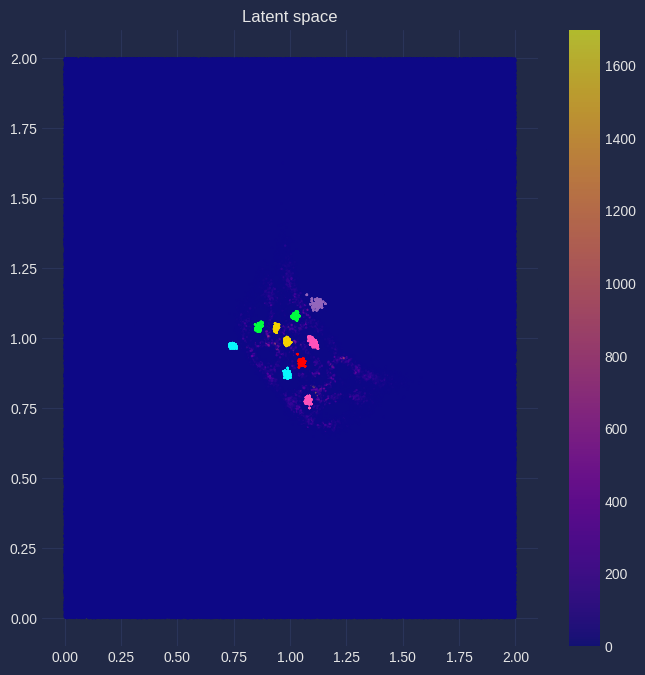

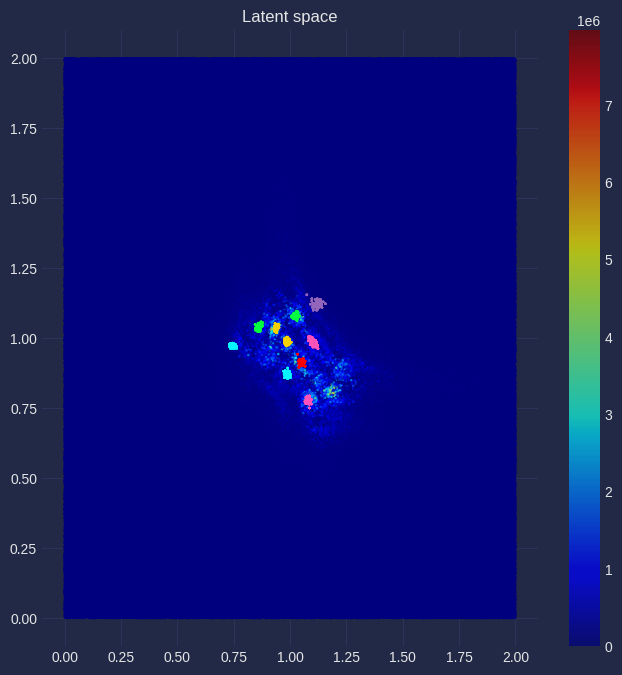

100%|██████████| 200001/200001 [12:48:39<00:00,  4.34it/s]

200000:(beta)=(    0.7069)


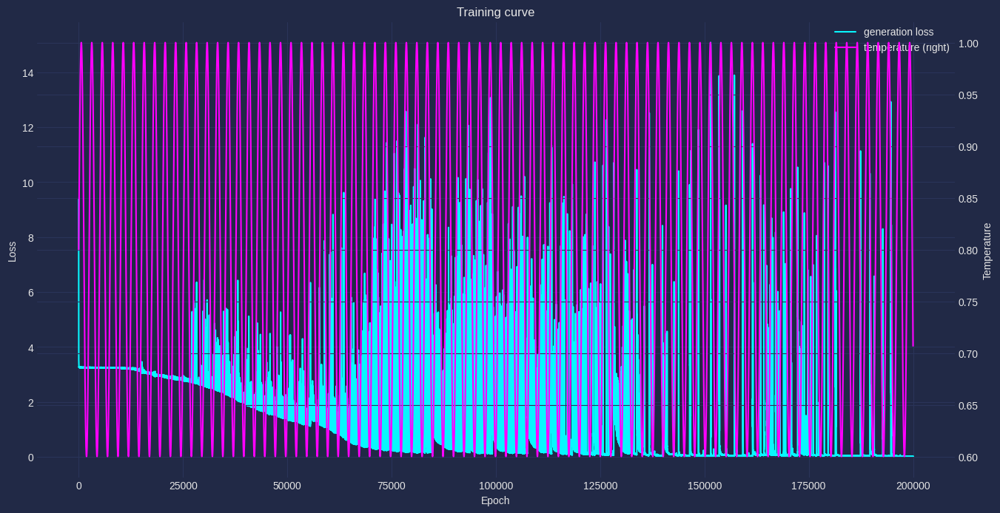

In [ ]:
# Optimizer
params = list(encoder.parameters()) + list(decoder.parameters())
#optimizer = optim.Adam(params, lr=5e-5, betas=(0.5, 0.999))
optimizer = optim.SGD(params, lr=1e-3, momentum=0.1)

# Training loop
ac_list = []
gen_loss_list = []
val_list = []
val_gen_loss_list = []
beta_list = []
fifs_list = []

beta_min = 1/5   # must be less than 1/2
cyclical_beta = (1 - beta_min) + beta_min * np.sin(500/n_epoch * np.arange(n_epoch))

for j in tqdm(range(n_epoch)):
    optimizer.zero_grad()

    loc, scale = encoder(x)
    prior = Normal(torch.zeros_like(loc), torch.ones_like(scale))
    posterior = Normal(loc, scale)
    z_sample = torch.add(loc, scale.pow_(prior.sample()))
    z_sample.requires_grad_(True)

    dec = decoder(z_sample)
    dec.requires_grad_(True)
    log_probs = Bernoulli(probs=dec.pow_(cyclical_beta[j])).log_prob(y)

    if j % 10000 == 0:
        n_vis = 10
        enc_test = torch.cat([z_sample for i in range(n_vis)], dim=0).detach().cpu().numpy()
        enc_test_label = np.tile(yl_train, (n_vis))
        n_vis = 1000
        z_range = np.random.uniform(0, 2, size=(batch_size*n_vis, latent_dim))
        decoder_params = dict(decoder.named_parameters())
        mfs = np.hstack([compute_magnification_factor(compute_jacobian(decoder, decoder_params, torch.Tensor(z_range[i*batch_size:(i+1)*batch_size]).to(device).requires_grad_(True))).detach().cpu().numpy() for i in range(n_vis)])
        fifs = np.hstack([compute_fisher_information_factor(compute_logprobs(model=decoder, params=decoder_params, input=torch.Tensor(z_range[i*batch_size:(i+1)*batch_size]).to(device).requires_grad_(True), cyclical_beta=cyclical_beta, j=j)).detach().cpu().numpy() for i in range(n_vis)])

        rcParams['figure.figsize'] = 8, 8
        plt.figure()
        plt.scatter(z_range[:, 0], z_range[:, 1],
                    #c=mfs, cmap=plt.cm.Reds,
                    c=mfs, cmap=plt.cm.plasma,
                    edgecolor='none', alpha=0.7, s=3)
        plt.colorbar()
        for i in range(len(np.unique(yl_train))):
            plt.scatter(enc_test[enc_test_label==i, 0], enc_test[enc_test_label==i, 1],
                        edgecolor='none', alpha=0.7, s=3)
        plt.title('Latent space')
        plt.show()

        rcParams['figure.figsize'] = 8, 8
        plt.figure()
        plt.scatter(z_range[:, 0], z_range[:, 1],
                    #c=fifs, cmap=plt.cm.Greens,
                    c=fifs, cmap=plt.cm.jet,
                    edgecolor='none', alpha=0.7, s=3)
        plt.colorbar()
        for i in range(len(np.unique(yl_train))):
            plt.scatter(enc_test[enc_test_label==i][:, 0], enc_test[enc_test_label==i][:, 1],
                        edgecolor='none', alpha=0.7, s=3)
        plt.title('Latent space')
        plt.show()


    # Loss functions
    kl_divergence = torch.distributions.kl_divergence(posterior, prior).mean()
    recon_likelihood = log_probs.sum(dim=1).mean()
    gen_loss = torch.sub(kl_divergence, recon_likelihood)

    gen_loss.backward(retain_graph=True)
    optimizer.step()

    with torch.no_grad():
        correct = (y.argmax(dim=1) == dec.argmax(dim=1)).float()
        accuracy = correct.mean()
        ac_list.append(accuracy.item())
        gen_loss_list.append(gen_loss.item())
        beta_list.append(cyclical_beta[j])

        if j % 1000 == 0:
            print("%5d:(beta)=(%10.4f)" % (j, cyclical_beta[j]))

rcParams['figure.figsize'] = 16, 8
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
ax1.plot(np.arange(n_epoch), np.asarray(gen_loss_list), label='generation loss')
#ax1.plot(np.arange(n_epoch), np.asarray(val_gen_loss_list), label='validation generation loss')
ax2.plot(np.arange(n_epoch), np.asarray(beta_list), label='temperature (right)', color='magenta')
handler1, label1 = ax1.get_legend_handles_labels()
handler2, label2 = ax2.get_legend_handles_labels()
ax1.legend(handler1 + handler2, label1 + label2, loc=1, borderaxespad=0.1)
plt.title('Training curve')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Temperature')
plt.show()

In [ ]:
loc, scale = encoder(x)
z_sample = torch.add(loc, scale.pow_(prior.sample()))
z_sample.requires_grad_(True)
dec = decoder(z_sample)
dec.requires_grad_(True)
jacobian = compute_jacobian(decoder, decoder_params, z_sample)

n_vis = 10
enc_test = torch.cat([z_sample for i in range(n_vis)], dim=0).detach().cpu().numpy()
enc_test_label = np.tile(yl_train, (n_vis))
n_vis = 1000
z_range = np.random.uniform(0, 2, size=(batch_size*n_vis, latent_dim))
decoder_params = dict(decoder.named_parameters())
mfs = np.hstack([compute_magnification_factor(compute_jacobian(decoder, decoder_params, torch.Tensor(z_range[i*batch_size:(i+1)*batch_size]).to(device).requires_grad_(True))).detach().cpu().numpy() for i in range(n_vis)])
fifs = np.hstack([compute_fisher_information_factor(compute_logprobs(decoder, decoder_params, torch.Tensor(z_range[i*batch_size:(i+1)*batch_size]).to(device).requires_grad_(True), cyclical_beta, j)).detach().cpu().numpy() for i in range(n_vis)])

print(mfs.shape)
print(z_range[:, 0].shape)
print(z_range[:, 1].shape)
print(enc_test.shape)
print(enc_test_label.shape)

(898000,)
(898000,)
(898000,)
(8980, 2)
(8980,)


In [ ]:
print(enc_test)
print(enc_test_label)

[[0.75080645 0.9734884 ]
 [0.85648906 1.0350407 ]
 [1.1055868  0.98139584]
 ...
 [0.98872143 0.9891645 ]
 [1.059305   0.9118279 ]
 [1.0093898  1.0772839 ]]
[0 3 1 ... 8 4 9]


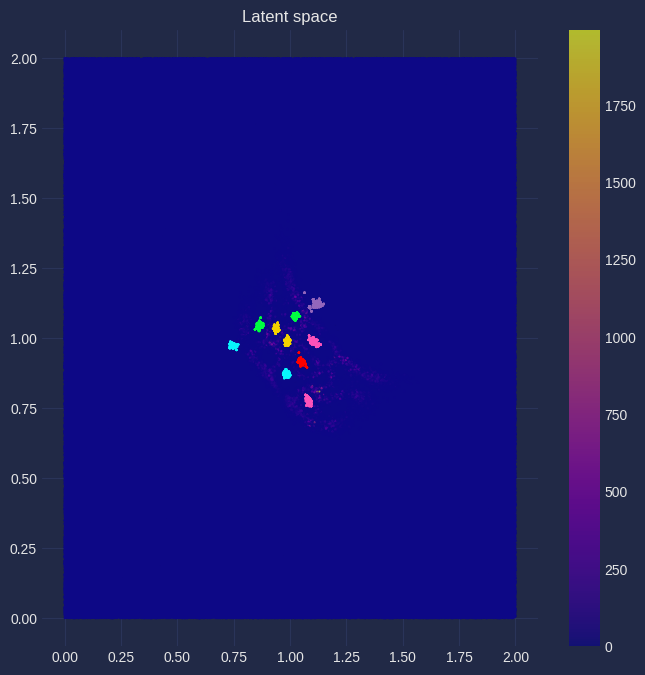

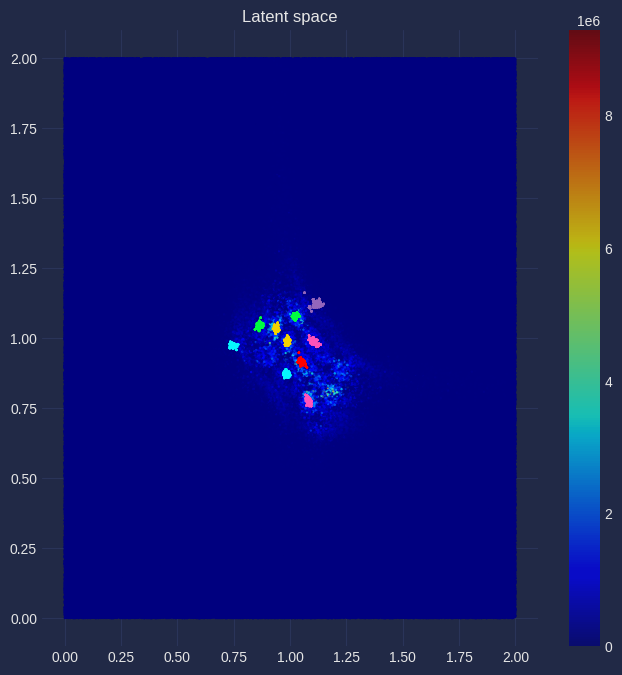

In [ ]:
rcParams['figure.figsize'] = 8, 8
plt.figure()
plt.scatter(z_range[:, 0], z_range[:, 1],
            c=mfs, cmap=plt.cm.plasma,
            edgecolor='none', alpha=0.7, s=3)
plt.colorbar()
for i in range(len(np.unique(yl_train))):
    plt.scatter(enc_test[enc_test_label==i, 0], enc_test[enc_test_label==i, 1],
                edgecolor='none', alpha=0.7, s=3)
plt.title('Latent space')
plt.show()

rcParams['figure.figsize'] = 8, 8
plt.figure()
plt.scatter(z_range[:, 0], z_range[:, 1],
            c=fifs, cmap=plt.cm.jet,
            edgecolor='none', alpha=0.7, s=3)
plt.colorbar()
for i in range(len(np.unique(yl_train))):
    plt.scatter(enc_test[enc_test_label==i][:, 0], enc_test[enc_test_label==i][:, 1],
                edgecolor='none', alpha=0.7, s=3)
plt.title('Latent space')
plt.show()